# 1. Importing Libraries

In [1]:
import os
import numpy as np
import pandas as pd
import ast
from scipy.stats import iqr,yeojohnson, skew, kurtosis
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objs as go

import missingno as msno
from sklearn.preprocessing import (
    PowerTransformer,
    OneHotEncoder,
    StandardScaler
)
import statsmodels.api as sm

import regex as re
import eda_helper_functions
from matplotlib import gridspec
import scipy.stats as stats
from IPython.display import display, HTML

In [2]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_colwidth',None)

In [3]:
df = pd.read_csv('mg_cleaned_dataset.csv')


C:\Users\ABC\AppData\Local\Temp\ipykernel_1472\3623266399.py:1: DtypeWarning: Columns (113,137,143,144,145,146,147,148) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('mg_cleaned_dataset.csv')


In [4]:
df.head(1)

id  \
0  cardid69429251   

                                                                                                                                        url  \
0  https://www.magicbricks.com/propertydetails/2-bhk-635-sq-ft-multistorey-apartment-for-sale-pokhran-road-in-thane&id=4d423639343239323531   

                                                                                                                                                   image  \
0  https://img.staticmb.com/mbimages/project/photo_h310_w462/2023/04/14/project-photo-6-raymond-realty-ten-x-habitat-thane-5124557_1200_1600_310_462.jpg   

                                                                        name  \
0  2 bhk flat  for sale in  tenx habitat raymond realty, pokhran road, thane   

                                                                                                      wholeaddress  \
0  {'@type': 'postaladdress', 'addresslocality': 'pokhran road', 'addressregion': 'thane', 'addresscountry': 'in'}   

                            address   flooring  \
0  pokhran road, thane, maharashtra  vitrified   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [5]:
df.shape

(11879, 179)

`observation`
- dataset consists of 11894 rows and 46 columns

In [6]:
#Columns in our dataset
df.columns

Index(['id', 'url', 'image', 'name', 'wholeaddress', 'address', 'flooring',
       'image_urls', 'available_units', 'towers',
       ...
       'seller', 'price_category', 'education', 'transport', 'shopping_centre',
       'commercial_hub', 'hospital', 'tourist', 'emi', 'project_in_acres'],
      dtype='object', length=179)

In [7]:
#Description of our dataset
df.describe().T

#T refers to transpose that displays the description of our dataset in long format.

,count,mean,std,min,25%,50%,75%,max
available_units,6670.0,465.713193,1086.236968,6.000000,120.000000,282.000000,550.000000,40000.000000
towers,6862.0,4.626202,6.943504,1.000000,1.000000,3.000000,5.000000,200.000000
locality_rank,8056.0,122.479767,126.588342,1.000000,16.000000,92.000000,186.000000,839.000000
locality_rating,11416.0,3.758926,1.068225,0.000000,3.900000,4.000000,4.200000,5.000000
bath,11849.0,2.315638,0.963790,1.000000,2.000000,2.000000,3.000000,10.000000
parking,5655.0,1.392573,0.722386,1.000000,1.000000,1.000000,2.000000,12.000000
price,11879.0,2.909698,4.240230,0.017000,0.950000,1.780000,3.200000,80.000000
bed,11879.0,2.162472,0.981408,1.000000,1.000000,2.000000,3.000000,10.000000
area,11874.0,873.160013,576.075417,165.000000,540.000000,730.000000,1034.750000,12000.000000
costpersqft,11873.0,27792.409810,16216.267220,289.000000,16923.000000,25586.000000,34286.000000,270543.000000


In [8]:
#Information of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11879 entries, 0 to 11878
Columns: 179 entries, id to project_in_acres
dtypes: float64(18), object(161)
memory usage: 16.2+ MB


`observation`
- Our dataset features consists of three datatypes
  - float
  - integer
  - object
- Of which total numerical features are 18
- And categorical features are 28.

In [9]:
#Description of our dataset
df.describe(include='O').T

,count,unique,top,freq
id,11879,11879,cardid69429251,1
url,11879,11879,https://www.magicbricks.com/propertydetails/2-bhk-635-sq-ft-multistorey-apartment-for-sale-pokhran-road-in-thane&id=4d423639343239323531,1
image,10992,9846,https://img.staticmb.com/mbimages/project/photo_h310_w462/2024/02/20/project-photo-4-godrej-reserve-mumbai-5419091_1000_800_310_462.jpg,25
name,11879,5720,1 bhk flat for sale in mumbai,119
wholeaddress,11879,921,"{'@type': 'postaladdress', 'addresslocality': 'mulund west', 'addressregion': 'mumbai', 'addresscountry': 'in'}",336
address,11879,5672,"panvel, navi mumbai - central navi mumbai, maharashtra",138
flooring,11879,253,unknown,4442
image_urls,7637,3401,"['https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/28/project-photo-27-piramal-mahalaxmi-mumbai-5114935_345_1366_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/28/project-photo-27-piramal-mahalaxmi-mumbai-5114935_345_1366_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/28/project-photo-29-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/28/project-photo-28-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/28/project-photo-27-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-25-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-24-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-23-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-22-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-21-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-20-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-19-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-18-piramal-mahalaxmi-mumbai-5114935_1200_1600_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-17-piramal-mahalaxmi-mumbai-5114935_1200_1600_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-16-piramal-mahalaxmi-mumbai-5114935_1200_1600_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-15-piramal-mahalaxmi-mumbai-5114935_1200_1600_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-14-piramal-mahalaxmi-mumbai-5114935_1200_1600_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-13-piramal-mahalaxmi-mumbai-5114935_1200_1600_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/07/13/project-photo-12-piramal-mahalaxmi-mumbai-5114935_1200_1600_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/05/17/project-photo-11-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/05/17/project-photo-10-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/05/17/project-photo-9-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mbimages/project/photo_h310_w462/2021/05/17/project-photo-8-piramal-mahalaxmi-mumbai-5114935_600_800_310_462.jpg', 'https://img.staticmb.com/mb

`observation`
- from this above we got to know for object dtypes
- count, unijque values, top values of that specific dtype, and freq of that particular top dtype

    - Total records: 11,879  
    - image: 10,992 non-null, but only 9,846 unique → duplicates exist  
    - image_urls: Present in 7,637 rows, only 3,401 unique → high duplication  

---

- Location

    - addressregion: Only 4 unique → low granularity  
    - location_from_wholeaddress: 904 unique → detailed locations  

---

- Property Info

    - wholeaddress: 921 unique → high repetition  
    - flooring: 4,442 = “unknown” → ~37% missing  
    - construction: Most = “under construction” (4,554)  
    - ownership: Most = “freehold” (5,915), ~30% missing  
    - furnish: Mostly “unfurnished” (7,472)  
    - status: Mostly “ready to move” (7,239)  
    - facing: Mostly “east” (4,728)  

---

- Other Columns

    - extra_rooms: ~45% missing  
    - project_name: 2,940 unique → many projects  
    - builder: 1,145 unique  
    - seller: Mostly “realestateagent” (8,106)  
    - price_category: Most in "1.00 - 1.99" crore (3,462)  

---

- Nearby Amenities

    - hospital: Only 3,296 filled (27.7%), 56 unique → limited data  

# User-Defined Functions

about data : value_counts and unique categories 

In [10]:
def analyze_column(df, feature, top_n=None, threshold=None):
    import warnings
    warnings.filterwarnings("ignore")

    col = df.loc[:, feature].copy()

    print('-' * 50)
    print(f"Quick Glance of '{feature}':")
    display(col.head())

    print('-' * 50)
    print(f"Meta-data for '{feature}':")
    print(f"{'Data Type':15}: {col.dtype}")
    print(f"{'Cardinality':15}: {col.nunique(dropna=True)}")
    print(f"{'Missing Data':15}: {col.isna().sum():,} rows ({col.isna().mean() * 100:.2f} %)")
    print(f"{'Available Data':15}: {col.count():,} / {len(col):,} rows")

    if col.dtype in ["float64", "int64"]:  # Numerical column
        print('-' * 50)
        print(f"Descriptive Statistics for '{feature}':")
        display(col.describe())

        print('-' * 50)
        print(f"Top Frequent Values in '{feature}':")

        value_counts = col.value_counts().to_frame(name='count')
        total = col.count()  #Use non-null count to get valid total
        value_counts['percentage'] = (value_counts['count'] / total * 100).round(2)
        value_counts['cum_percent'] = value_counts['percentage'].cumsum().round(2)

        # Filter by threshold (before top_n)
        if threshold is not None:
            value_counts = value_counts[value_counts['cum_percent'] <= threshold]

        # Apply top_n filter if given
        if top_n is not None:
            display(value_counts.head(top_n))
        else:
            display(value_counts)

        # After displaying, print the values list
        if threshold is not None:
            value_list = value_counts.index.tolist()
            print(f"\n{len(value_list)} Values in '{feature}' with cumulative percentage ≤ {threshold}%:")
            print(value_list)


about categorical data : unique categories in column ,missing values in column ,percentage of each categories in column   

In [11]:
# Categorical summary function with top_n and threshold
def cat_summary(data, var, top_n=None, threshold=None):
    import pandas as pd
    import warnings
    warnings.filterwarnings("ignore")

    col = data.loc[:, var].copy()

    # Quick Glance
    print('-'*50)
    print('Quick Glance:')
    display(col.head())

    # Meta-data
    print('-'*50)
    print('Meta-data')
    print(f"{'Data Type':15}: {col.dtype}")
    print(f"{'Cardinality':15}: {col.nunique(dropna=True)} categories")
    print(f"{'Missing Data':15}: {col.isna().sum():,} rows ({col.isna().mean() * 100:.2f} %)")
    print(f"{'Available Data':15}: {col.count():,} / {len(col):,} rows")

    # Summary
    print('-'*50)
    print('summary:')
    display(col.describe().rename("").to_frame())

    # Category Distribution
    print('-'*50)
    print('Categories Distribution:')
    vc = col.value_counts()
    total = col.count()  #Use count() to exclude NaN from percentage calculations

    percentage = (vc / total * 100).round(2)
    cum_percent = percentage.cumsum().round(2)

    vc_df = pd.DataFrame({
        "count": vc,
        "percentage": percentage,
        "cum_percent": cum_percent
    })
    vc_df.index.name = "category"

    # Apply threshold first
    if threshold is not None:
        vc_df = vc_df[vc_df['cum_percent'] <= threshold]

    # Apply top_n filter
    if top_n is not None:
        vc_df = vc_df.head(top_n)

    display(vc_df)

    # Print values within threshold
    if threshold is not None:
        values_list = vc_df.index.tolist()
        print(f"\n{len(values_list)} Categories in '{var}' with cumulative percentage ≤ {threshold}%:")
        print(values_list)


Function to visualize the distribution of a numerical feature using Histogram, QQ Plot, and Box Plot

In [12]:
def num_three_chart_plot(df, feature):
    fig = plt.figure(constrained_layout=True, figsize=(20, 8))
    grid = gridspec.GridSpec(ncols=4, nrows=6, figure=fig)

    ax1 = fig.add_subplot(grid[0:3, :3])  # Increase histogram height
    ax1.set_title('Histogram')
    sns.histplot(df[feature], kde=True, ax=ax1)
    ax1.axvline(x=df[feature].mean(), c='red', label="Mean")
    ax1.axvline(x=df[feature].median(), c='green', label="Median")
    ax1.legend()

    ax2 = fig.add_subplot(grid[3:6, :3])  # Increase probability plot height
    ax2.set_title('QQ Plot')
    stats.probplot(df[feature], plot=ax2)

    ax3 = fig.add_subplot(grid[:, 3])
    ax3.set_title('Box Plot')
    sns.boxplot(y=df[feature], ax=ax3)

    plt.show()

Bar Plot and pie chart Function

In [13]:
def bar_pie_chart_plot(df, feature, bar_top_n=None, pie_top_n=None):
    fig = plt.figure(constrained_layout=True, figsize=(25, 8))
    grid = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)  # 2 columns: Bar plot + Pie chart

    # Get value counts and sort in descending order
    value_counts = df[feature].value_counts().sort_values(ascending=False)

    # Bar Chart Data (Apply bar_top_n filter if specified)
    bar_data = value_counts.reset_index()
    if bar_top_n is not None and bar_top_n < len(value_counts):
        bar_data = bar_data.iloc[:bar_top_n]
    bar_data.columns = [feature, 'count']

    # Pie Chart Data (Top N categories + "Others" only if needed)
    if pie_top_n is not None and pie_top_n < len(value_counts):
        top_values = value_counts.iloc[:pie_top_n]  # Keep only top N categories
        others_sum = value_counts.iloc[pie_top_n:].sum()  # Sum of remaining categories
        pie_data = pd.concat([top_values, pd.Series({'Others': others_sum})])  # Add "Others"
        pie_data = pie_data.reset_index()
        pie_data.columns = [feature, 'count']
    else:
        pie_data = value_counts.reset_index()
        pie_data.columns = [feature, 'count']

    pie_data = pie_data.sort_values(by="count", ascending=False)  # Ensure sorting

    # Bar Chart
    ax1 = fig.add_subplot(grid[0, 0])
    ax1.set_title(f'{feature} Distribution - Bar Chart (Top {bar_top_n if bar_top_n else "All"})', fontsize=14)

    sns.barplot(x=feature, y='count', data=bar_data, ax=ax1, order=bar_data[feature], 
                palette='tab10', edgecolor='black')

    # Add count labels on top of bars
    for p in ax1.patches:
        ax1.annotate(f'{int(p.get_height())}', 
                     (p.get_x() + p.get_width() / 2, p.get_height()), 
                     ha='center', va='bottom', fontsize=12, color='black')

    ax1.set_xticks(range(len(bar_data[feature])))  # Explicitly set tick positions
    ax1.set_xticklabels(bar_data[feature], rotation=45, ha='right', fontsize=10)
    ax1.grid(axis="y", linestyle="--", alpha=0.7)
    ax1.set_ylabel("Count")

    # Pie Chart
    ax2 = fig.add_subplot(grid[0, 1])
    ax2.set_title(f'{feature} Distribution - Pie Chart (Top {pie_top_n if pie_top_n else "All"})', fontsize=14)

    ax2.pie(pie_data['count'], labels=pie_data[feature], autopct='%1.1f%%', colors=sns.color_palette('tab10'), 
            wedgeprops={'edgecolor': 'black'},radius=1.1)

    plt.show()

function calculates skewness, kurtosis, quartiles (Q1 & Q3), interquartile range (IQR), lower & upper whiskers, and user-specified quantiles for a given numerical feature in a DataFrame.

In [14]:
# gives detailed summary of numeric features
def num_summary(data, var):
  import warnings
  warnings.filterwarnings("ignore")

  col = data.loc[:, var].copy()

  # quantiles
  print('-'*50)
  print('Percentiles:')  
  display(
      col
      .quantile([0.0, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99, 1.0])
      .rename(index=lambda val: f"{val * 100:.0f}")
      .rename("value")
      .rename_axis(index="percentile")
      .to_frame()
  )

  # central tendancy
  print('-'*50)
  print('Central Tendancy:')
  display(
      pd
      .Series({
          "mean": col.mean(),
          "trimmed mean (5%)": stats.trim_mean(col.values, 0.05),
          "trimmed mean (10%)": stats.trim_mean(col.values, 0.1),
          "median": col.median()
      })
      .rename("value")
      .to_frame()
  )

  # spread
  print('-'*50)
  print('Measure of Spread:')
  std = col.std()
  q1 = col.quantile(0.25)
  q3 = col.quantile(0.75)
  iqr = q3 - q1
  lower_bound = q1 - 1.5 * iqr
  upper_bound = q3 + 1.5 * iqr
  display(
      pd
      .Series({
          "var": col.var(),
          "std": std,
          "IQR": iqr,
          "lower_bound": lower_bound,
          "upper_bound": upper_bound,
          "mad": stats.median_abs_deviation(col.dropna()),
          "coef_variance": std / col.mean()
      })
      .rename("value")
      .to_frame()
  )

  # skewness and kurtosis
  print('-'*50)
  print('Skewness and Kurtosis:')
  display(
      pd
      .Series({
          "skewness": col.skew(),
          "kurtosis": col.kurtosis()
      })
      .rename("value")
      .to_frame()
  )

  alpha = 0.05
  # test for normality
  print('-'*50)
  print('Hypothesis Testing for Normality:')
  # shapiro-wilk test
  print('Shapiro-Wilk Test:')
  sw_test = stats.shapiro(col.dropna().values)
  sw_statistic = sw_test.statistic
  sw_pvalue = sw_test.pvalue
  print(f"{'Significance Level':21}: {alpha}")
  print(f"{'Null Hypothesis':21}: The data is normally distributed")
  print(f"{'Alternate Hypothesis':21}: The data is not normally distributed")
  print(f"{'p-value':21}: {sw_pvalue}")
  print(f"{'Test Statistic':21}: {sw_statistic}")
  if sw_pvalue < alpha:
    print(f"- Since p-value is less than alpha ({alpha}), we Reject the Null Hypothesis at {alpha * 100}% significance level")
    print("- CONCLUSION: We conclude that the data sample is not normally distributed")
  else:
    print(f"- Since p-value is greater than alpha ({alpha}), we Fail to Reject the Null Hypothesis at {alpha * 100}% significance level")
    print("- CONCLUSION: We conclude that the data sample is normally distributed")

  # anderson-darling test
  print('-'*50)
  print('Anderson-Darling Test:')
  ad_test = stats.anderson(col.dropna().values, dist="norm")
  ad_statistic = ad_test.statistic
  ad_critical = ad_test.critical_values[2]
  print(f"{'Significance Level':21}: {alpha}")
  print(f"{'Null Hypothesis':21}: The data is normally distributed")
  print(f"{'Alternate Hypothesis':21}: The data is not normally distributed")
  print(f"{'Critical Value':21}: {ad_critical}")
  print(f"{'Test Statistic':21}: {ad_statistic}")
  if ad_statistic >= ad_critical:
    print(f"- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at {alpha * 100}% significance level")
    print("- CONCLUSION: We conclude that the data sample is not normally distributed")
  else:
    print(f"- Since the Test-statistic is less than Critical Value, we Fail to Reject the Null Hypothesis at {alpha * 100}% significance level")
    print("- CONCLUSION: We conclude that the data sample is normally distributed")


- If skewness = 0 → Symmetrical distribution.  
- If skewness ≠ 0 → Non-symmetrical distribution.  
- If skewness < 0 → Left-skewed (long tail on the left).  
- If skewness > 0 → Right-skewed (long tail on the right).

extract km values and avg of log1p values 

In [15]:
def extract_km_values(row):
    if pd.isnull(row):
        return None
    return [float(val) for val in re.findall(r'(\d+\.\d+)\s*km', row)]

def log1p_and_average(distances):
    if distances is None or len(distances) == 0:
        return None
    log1p_distances = [np.log1p(d) for d in distances]
    return np.mean(log1p_distances)

def process_km_column(df, feature):
    """
    Extract numerical values before 'km' from a given feature column,
    compute log1p of distances, and take the average.
    """
    feature_name = feature + '_extracted_km'
    log_feature_name = feature + '_log1p_avg_km'
    
    df[feature_name] = df[feature].apply(extract_km_values)
    df[log_feature_name] = df[feature_name].apply(log1p_and_average)

    print(f"Columns that were created: '{feature_name}', '{log_feature_name}'")

hypothesis testing for categorical columns : ANOVA test and kruskal-wallis test

In [16]:
# hypothesis testing for association between numeric and categorical variable
def num_cat_hyp_testing(data, num_var, cat_var, alpha=0.05):
  display_html(2, f"Hypothesis Test for Association between {num_var} and {cat_var}")

  groups_df = (
      data
      .dropna(subset=[num_var])
      .groupby(cat_var)
  )
  groups = [group[num_var].values for _, group in groups_df]

  # anova test
  anova = stats.f_oneway(*groups)
  statistic = anova[0]
  pvalue = anova[1]
  display_html(3, "ANOVA Test")
  print(f"- {'Significance Level':21}: {alpha * 100}%")
  print(f"- {'Null Hypothesis':21}: The groups have similar population mean")
  print(f"- {'Alternate Hypothesis':21}: The groups don't have similar population mean")
  print(f"- {'Test Statistic':21}: {statistic}")
  print(f"- {'p-value':21}: {pvalue}")
  if pvalue < alpha:
    print(f"- Since p-value is less than {alpha}, we Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {num_var} and {cat_var} are associated to each other")
  else:
    print(f"- Since p-value is greater than {alpha}, we Fail to Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {num_var} and {cat_var} are not associated to each other")

  # kruskal-wallis test
  kruskal = stats.kruskal(*groups)
  statistic = kruskal[0]
  pvalue = kruskal[1]
  display_html(3, "Kruskal-Wallis Test")
  print(f"- {'Significance Level':21}: {alpha * 100}%")
  print(f"- {'Null Hypothesis':21}: The groups have similar population median")
  print(f"- {'Alternate Hypothesis':21}: The groups don't have similar population median")
  print(f"- {'Test Statistic':21}: {statistic}")
  print(f"- {'p-value':21}: {pvalue}")
  if pvalue < alpha:
    print(f"- Since p-value is less than {alpha}, we Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {num_var} and {cat_var} are associated to each other")
  else:
    print(f"- Since p-value is greater than {alpha}, we Fail to Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {num_var} and {cat_var} are not associated to each other")


In [17]:
def num_univar_plots(data, var, bins=10, figsize=(13, 8)):

    col = data.loc[:, var].copy()

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.ravel()

    # Histogram
    sns.histplot(
        data,
        x=var,
        bins=bins,
        kde=True,
        color="#1973bd",
        ax=axes[0],
    )
    sns.rugplot(
        data,
        x=var,
        color="black",
        height=0.035,
        ax=axes[0]
    )
    axes[0].set(title="Histogram")

    # CDF
    sns.ecdfplot(
        data,
        x=var,
        ax=axes[1],
        color="red"
    )
    axes[1].set(title="CDF")

    # Power Transform
    data = data.assign(**{
        f"{var}_pwt": (
            PowerTransformer()
            .fit_transform(data.loc[:, [var]])
            .ravel()
        )
    })
    sns.kdeplot(
        data,
        x=f"{var}_pwt",
        fill=True,
        color="#f2b02c",
        ax=axes[2]
    )
    sns.rugplot(
        data,
        x=f"{var}_pwt",
        color="black",
        height=0.035,
        ax=axes[2]
    )
    axes[2].set(title="Power Transformed")  #by default it use yeo-johnson transform 

    # Violin Plot
    sns.violinplot(
        data,
        x=var,
        color="#ed68b4",
        ax=axes[3]
    )
    axes[3].set(title="Violin Plot")

    plt.tight_layout()
    plt.show()


Let's first analyze the target column, then perform univariate analysis on numerical columns, and finally examine categorical columns.

# price 

In [18]:
analyze_column(df, 'price', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'price':


0    1.80
1    2.37
2    1.80
3    1.64
4    1.26
Name: price, dtype: float64

--------------------------------------------------
Meta-data for 'price':
Data Type      : float64
Cardinality    : 1170
Missing Data   : 0 rows (0.00 %)
Available Data : 11,879 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'price':


count    11879.000000
mean         2.909698
std          4.240230
min          0.017000
25%          0.950000
50%          1.780000
75%          3.200000
max         80.000000
Name: price, dtype: float64

--------------------------------------------------
Top Frequent Values in 'price':


,count,percentage,cum_percent
price,,,
1.25,150,1.26,1.26
1.10,148,1.25,2.51
1.20,130,1.09,3.60
2.50,130,1.09,4.69
1.50,124,1.04,5.73



20 Values in 'price' with cumulative percentage ≤ 20%:
[1.25, 1.1, 1.2, 2.5, 1.5, 1.4, 1.75, 1.8, 2.0, 0.9, 1.9, 2.25, 1.35, 1.0, 0.75, 1.3, 0.95, 2.3, 1.6, 1.7]


`observation`
  - No missing values.
  - Mean Price: The average price is approximately 2.90 crores.
  - Median Price: The median (or 50th percentile) price is 1.78 crores.
  - The standard deviation is 4.24 Cr, indicating significant variation in prices.
  - Range: Prices range from a minimum of 0.01 crores to a maximum of 80 crores.
  - max price is 80 cr and 75 percentile is 3.20cr this clearly indicatie that there is outliers in the data
  - IQR: The interquartile range is from 0.95 crores(25th percentile) to 3.20 crores(50th percentile).

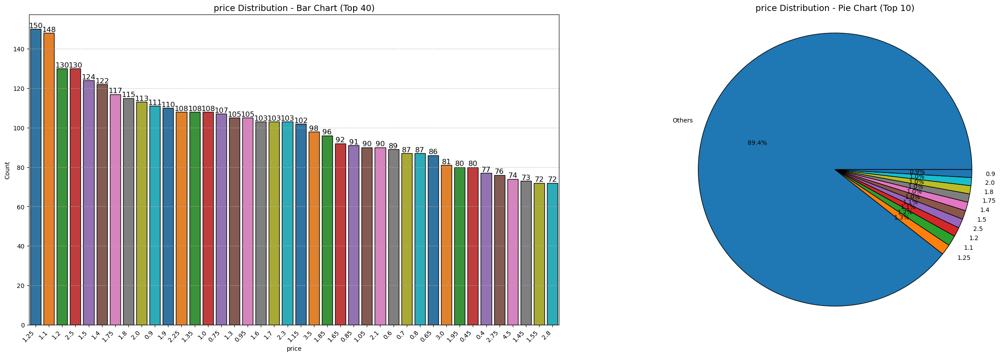

In [19]:
bar_pie_chart_plot(df, 'price', bar_top_n=40, pie_top_n=10)

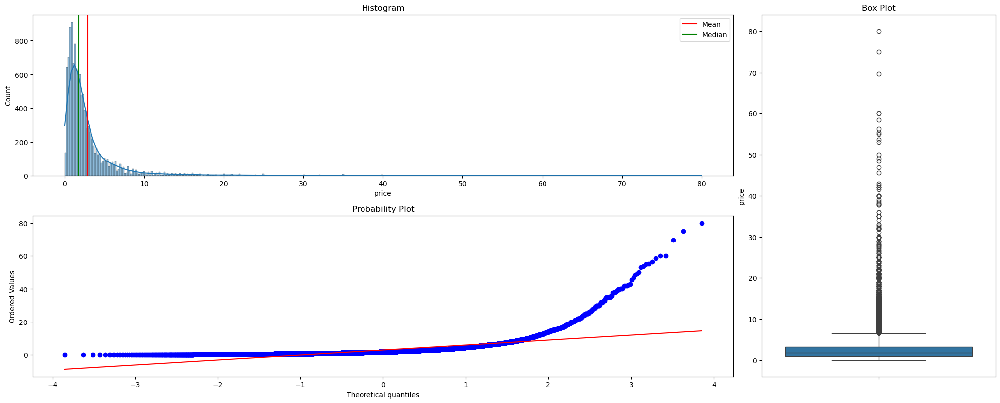

In [20]:
num_three_chart_plot(df, 'price')

`observation`
- Right-skewed distribution → Most prices are in the lower range (below 5 Cr).
- Box plot → Prices above ~10 Cr are likely outliers.
- Majority of prices fall within 0.95–3.2 Cr, with a dense cluster near the median.

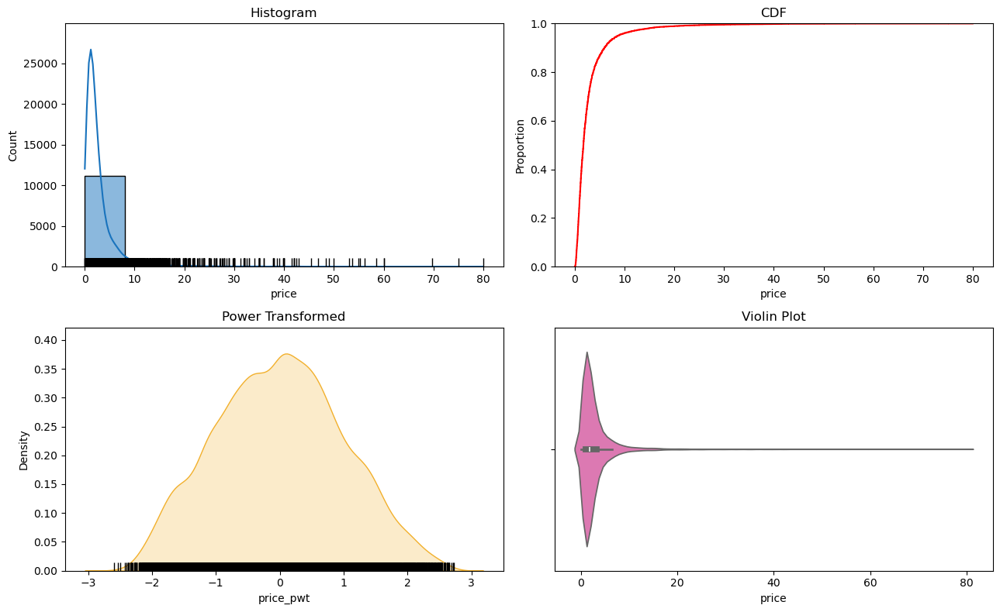

In [21]:
num_univar_plots(df, 'price', bins=10)

`observation`
- Most of the flats are priced below ₹10 Cr.
- Compared to properties below ₹10 Cr, there are fewer properties above ₹10 Cr. The highest price is ₹80 Cr, as shown by the rug plot.
- Power Transform: In this, we use Yeo-Johnson tranform, which tries to make the distribution of the feature as symmetric as possible.
- Note: Power Transform does not make the feature perfectly Gaussian — it only tries to reduce skewness and improve symmetry.

In [22]:
num_summary(df,'price')

--------------------------------------------------
Percentiles:


,value
percentile,
0,0.017
5,0.360
10,0.540
25,0.950
50,1.780
75,3.200
90,6.000
95,8.750
99,21.000


--------------------------------------------------
Central Tendancy:


,value
mean,2.909698
trimmed mean (5%),2.290629
trimmed mean (10%),2.103475
median,1.780000


--------------------------------------------------
Measure of Spread:


,value
var,17.979553
std,4.240230
IQR,2.250000
lower_bound,-2.425000
upper_bound,6.575000
mad,0.980000
coef_variance,1.457275


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,6.194829
kurtosis,60.864845


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 5.5711218540082956e-102
Test Statistic       : 0.5034615412963208
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 1443.7348049250886
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- skewness 6.20, which is highly positive
- right-skewed distribution
- kurtosis 60.93, which is extremely high.
- High kurtosis indicates a leptokurtic distribution**(leptokurtic = sample kurtosis -3 > 0 and in leptokurtic we have Heavy tails, sharp peak, more outliers than normal)
- 95% Quantile: 95% of properties are priced below 8.75 crores.
- 99% Quantile: 99% of properties are priced below 21 crores, indicating that very few properties are priced above this value.
- 50% of properties are below 1.78cr and 50% of properties are above 1.78cr
- 25 percentile is 0.950 and 50 percentile is 1.780 means 25 percent data is above 0.950 and less than 1.780 cr
- Q1=0.95  ,Q2=1.78 , Q3= 3.20
- on an average flats are 2.90 cr
- trimmed mean 5% means after sorting price col, we trimmed the upper and lower 5% values and then find the mean of the remaining values, same for trimmed mean 10%
- mean = 2.90 and median =1.78 , price column is skewed
- std dev = 4.24, this means on an avg, price of flat is ±4.24 cr from the mean, so this means w.r.t. mean values, on avg our flats are +4.24 or -4.24 in this range.
- MAD = 0.98, much smaller than std → data has some outliers or skewness
- using hypotheisis testing we got to know that the price is not normallky distruibuted 

`Potential Actions:`
- Consider log transformation or other scaling techniques to reduce skewness.
- Investigate the outliers 
- Use non-parametric statistical methods (e.g., Mann-Whitney U, Spearman correlation) for hypothesis testing or correlations if normality cannot be assumed.

<Axes: xlabel='price'>

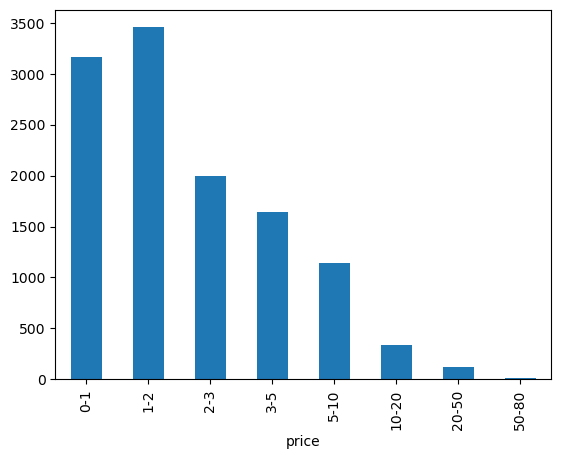

In [23]:
# price binning
bins = [0, 1, 2, 3, 5, 10, 20, 50, 80]
bin_labels = ["0-1", "1-2", "2-3", "3-5", "5-10", "10-20", "20-50", "50-80"]
pd.cut(df['price'], bins=bins, labels=bin_labels, right=False).value_counts().sort_index().plot(kind='bar')

`observation`
- The majority of properties are priced in the "0-1","1-2","2-3" and "3-5" crores" ranges.
- There is a noticeable decrease in the number of properties priced above 5 crores.

# Univariate analysis on Numerical columns

In [24]:
#find the numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns
print(numerical_columns)
print("-"*100)
print(f'total numerical columns : {len(numerical_columns)}')

Index(['available_units', 'towers', 'locality_rank', 'locality_rating', 'bath',
       'parking', 'price', 'bed', 'area', 'costpersqft', 'lift',
       'flat_on_floor', 'total_floor', 'balcony', 'lattitude', 'longitude',
       'emi', 'project_in_acres'],
      dtype='object')
----------------------------------------------------------------------------------------------------
total numerical columns : 18


# available_units

In [25]:
# no of unique categories and value_counts
analyze_column(df, 'available_units', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'available_units':


0    1512.0
1     810.0
2     412.0
3     339.0
4     174.0
Name: available_units, dtype: float64

--------------------------------------------------
Meta-data for 'available_units':
Data Type      : float64
Cardinality    : 589
Missing Data   : 5,209 rows (43.85 %)
Available Data : 6,670 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'available_units':


count     6670.000000
mean       465.713193
std       1086.236968
min          6.000000
25%        120.000000
50%        282.000000
75%        550.000000
max      40000.000000
Name: available_units, dtype: float64

--------------------------------------------------
Top Frequent Values in 'available_units':


,count,percentage,cum_percent
available_units,,,
1200.0,172,2.58,2.58
100.0,146,2.19,4.77
500.0,116,1.74,6.51
200.0,105,1.57,8.08
58.0,100,1.50,9.58



14 Values in 'available_units' with cumulative percentage ≤ 20%:
[1200.0, 100.0, 500.0, 200.0, 58.0, 361.0, 300.0, 72.0, 800.0, 720.0, 167.0, 1401.0, 400.0, 120.0]


`observation`    
- 75% of data have less than 550 units.  
- The values suddenly increase, reaching a maximum of 40,000 units, indicate outliers in data.
- The standard deviation is quite large, indicating high variability in the number of available units.
- mean (465.48) > median (282), the data is right-skewed

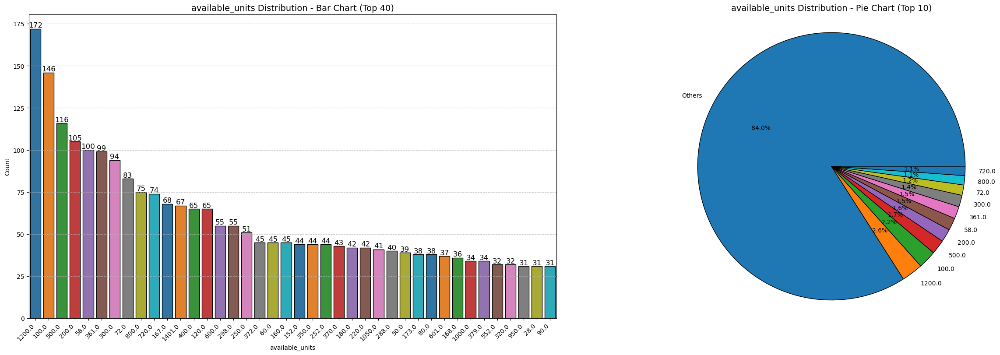

In [26]:
bar_pie_chart_plot(df, 'available_units', bar_top_n=40, pie_top_n=10)

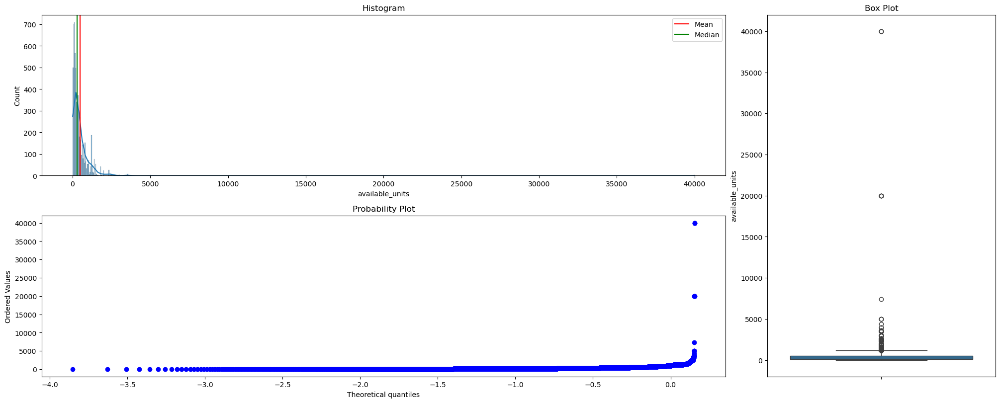

In [27]:
num_three_chart_plot(df, 'available_units')

`observation`  
Histogram: Right-skewed distribution with most values concentrated at the lower end.  
Box Plot: Shows extreme outliers, with most values within a small range.  
Q-Q plot: data points deviate significantly from the normal distribution in the upper range.  

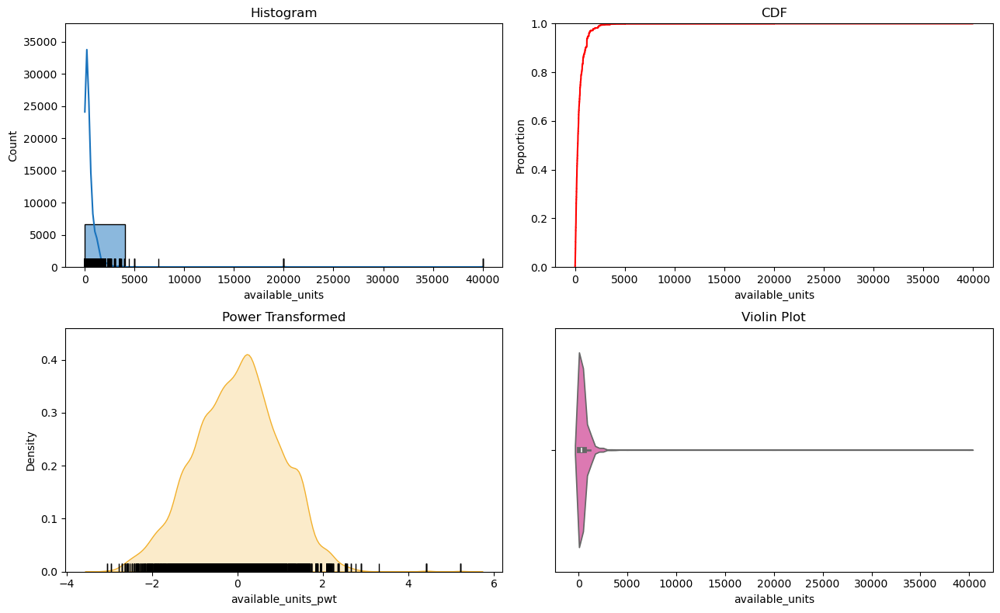

In [28]:
num_univar_plots(df, 'available_units', bins=10)

In [29]:
num_summary(df,'available_units')

--------------------------------------------------
Percentiles:


,value
percentile,
0,6.0
5,37.0
10,58.0
25,120.0
50,282.0
75,550.0
90,1063.0
95,1401.0
99,2444.0


--------------------------------------------------
Central Tendancy:


,value
mean,465.713193
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,282.000000


--------------------------------------------------
Measure of Spread:


,value
var,1.179911e+06
std,1.086237e+03
IQR,4.300000e+02
lower_bound,-5.250000e+02
upper_bound,1.195000e+03
mad,1.820000e+02
coef_variance,2.332416e+00


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,25.460134
kurtosis,850.662352


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 1.824405473324485e-97
Test Statistic       : 0.22625133442021395
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 1078.2930306156986
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- Few outliers affect the distribution.  
- Positive skewness 25.46 means a right-skewed distribution.  
- kurtosis 851.32 is highly leptokurtic, means heavy tails and many outliers.

# towers

In [30]:
# no of unique categories and value_counts
analyze_column(df, 'towers', top_n=42, threshold=100)

--------------------------------------------------
Quick Glance of 'towers':


0    10.0
1     6.0
2     2.0
3     1.0
4     1.0
Name: towers, dtype: float64

--------------------------------------------------
Meta-data for 'towers':
Data Type      : float64
Cardinality    : 42
Missing Data   : 5,017 rows (42.23 %)
Available Data : 6,862 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'towers':


count    6862.000000
mean        4.626202
std         6.943504
min         1.000000
25%         1.000000
50%         3.000000
75%         5.000000
max       200.000000
Name: towers, dtype: float64

--------------------------------------------------
Top Frequent Values in 'towers':


,count,percentage,cum_percent
towers,,,
1.0,1990,29.00,29.00
2.0,1192,17.37,46.37
3.0,1055,15.37,61.74
5.0,489,7.13,68.87
4.0,475,6.92,75.79
6.0,429,6.25,82.04
8.0,322,4.69,86.73
7.0,151,2.20,88.93
9.0,115,1.68,90.61



42 Values in 'towers' with cumulative percentage ≤ 100%:
[1.0, 2.0, 3.0, 5.0, 4.0, 6.0, 8.0, 7.0, 9.0, 15.0, 11.0, 20.0, 10.0, 12.0, 16.0, 28.0, 14.0, 19.0, 13.0, 17.0, 25.0, 40.0, 22.0, 34.0, 27.0, 90.0, 18.0, 24.0, 30.0, 31.0, 38.0, 56.0, 26.0, 21.0, 55.0, 36.0, 100.0, 23.0, 45.0, 200.0, 42.0, 35.0]


`observation`
- Mean (4.62) > Median (3) → Right-skewed distribution.
- Std (6.94) → High variability in tower counts.
- 75% (5), Max (200) → Large range, potential outliers.
- 25% (1), 75% (5) → 50% of data falls between 1 and 5 towers
- 90% of properties have 8 towers

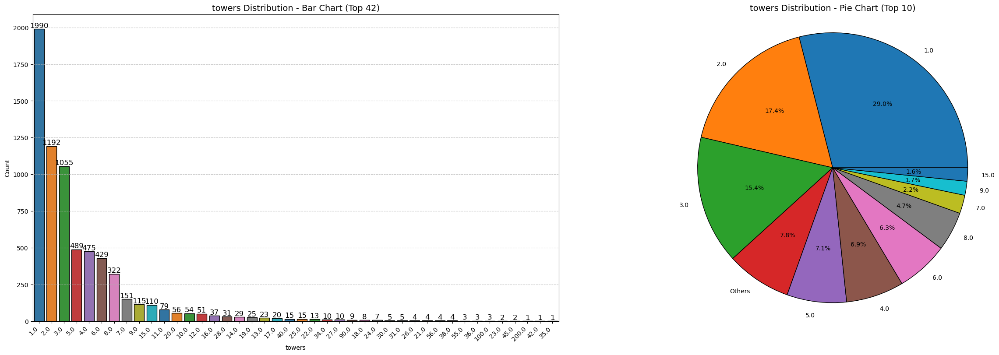

In [31]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'towers', bar_top_n=42, pie_top_n=10)

`observation`
- 5026 missing values
- most of the builders make less than 9 towers
- The highest frequency is observed for lower values of towers (e.g., 1, 2, or 3 towers).
- As the number of towers increases, the frequency decreases significantly.
- The distribution is right-skewed.

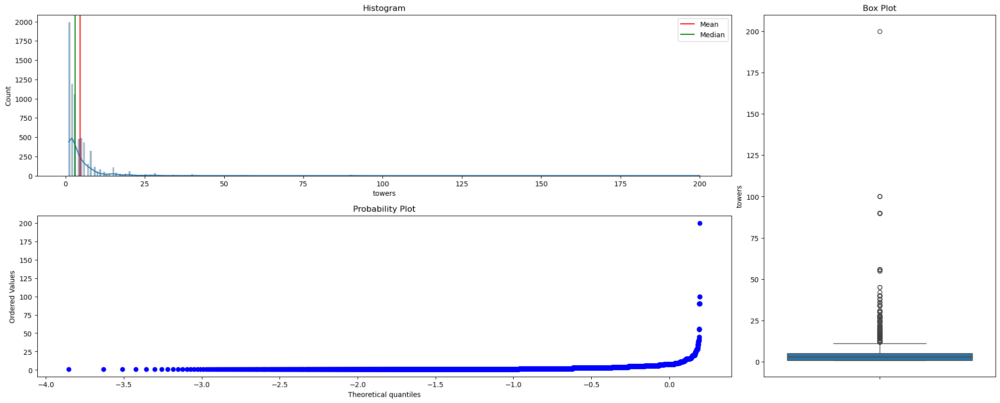

In [32]:
num_three_chart_plot(df, 'towers')

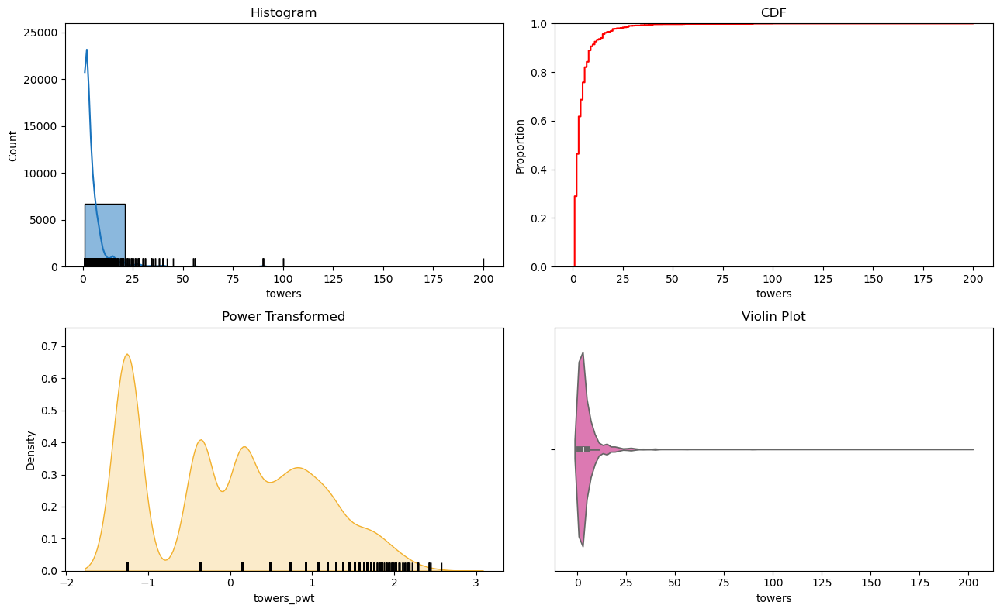

In [33]:
num_univar_plots(df, 'towers', bins=10)

In [34]:
num_summary(df,'towers')

--------------------------------------------------
Percentiles:


,value
percentile,
0,1.0
5,1.0
10,1.0
25,1.0
50,3.0
75,5.0
90,9.0
95,15.0
99,28.0


--------------------------------------------------
Central Tendancy:


,value
mean,4.626202
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,3.000000


--------------------------------------------------
Measure of Spread:


,value
var,48.212244
std,6.943504
IQR,4.000000
lower_bound,-5.000000
upper_bound,11.000000
mad,2.000000
coef_variance,1.500908


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,8.473333
kurtosis,141.833905


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 2.2709725485398534e-89
Test Statistic       : 0.467976889777759
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 861.5171356126284
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`Observation`
- there are few outliers which affect the whole distribution
- A positive skewness value (like 8.47) suggests a heavily right-skewed distribution, meaning there are extreme high values in the dataset pulling the tail to the right.
- A high kurtosis value (like 141.86) indicates that the distribution has heavy tails and possibly significant outliers.

# locality_rank

In [35]:
# no of unique categories and value_counts
analyze_column(df, 'locality_rank', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'locality_rank':


0     14.0
1     11.0
2    401.0
3    118.0
4    376.0
Name: locality_rank, dtype: float64

--------------------------------------------------
Meta-data for 'locality_rank':
Data Type      : float64
Cardinality    : 179
Missing Data   : 3,823 rows (32.18 %)
Available Data : 8,056 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'locality_rank':


count    8056.000000
mean      122.479767
std       126.588342
min         1.000000
25%        16.000000
50%        92.000000
75%       186.000000
max       839.000000
Name: locality_rank, dtype: float64

--------------------------------------------------
Top Frequent Values in 'locality_rank':


,count,percentage,cum_percent
locality_rank,,,
186.0,412,5.11,5.11
4.0,371,4.61,9.72
46.0,336,4.17,13.89
8.0,301,3.74,17.63



4 Values in 'locality_rank' with cumulative percentage ≤ 20%:
[186.0, 4.0, 46.0, 8.0]


`observation`
- 3831 missing values
- Min rank is 1, max is 839.  
- Mean rank is 122.38, median is 92 (right-skewed).  
- 25% of localities have ranks ≤ 16; 50% ≤ 92.  
- Standard deviation is 126.50; high variability.  
- Data covers 1–839 ranks

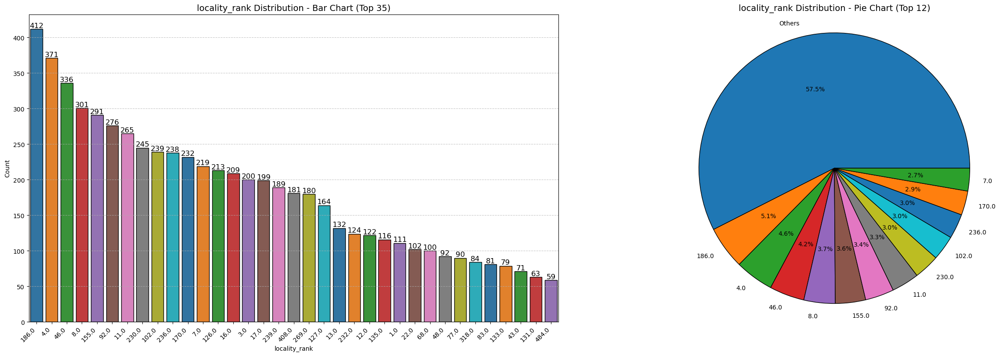

In [36]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'locality_rank', bar_top_n=35, pie_top_n=12)

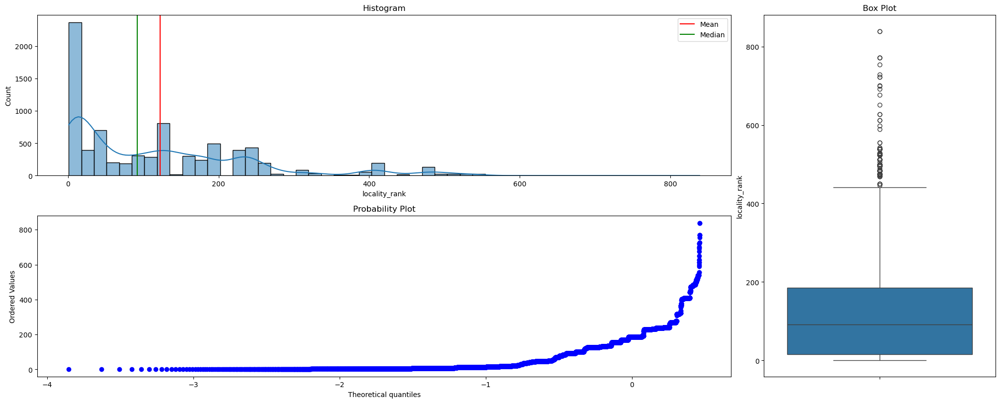

In [37]:
num_three_chart_plot(df, 'locality_rank')

`observation`
- The distribution is right-skewed, with most localities having lower ranks.
- A significant number of localities have ranks close to 1–50.
- Ranks above 200 are relatively sparse, with a gradual decline towards the maximum rank (839).
- The highest frequency is observed for ranks near 1.
- The presence of multiple peaks indicates possible clustering in locality ranks.

`observations`
- The IQR (blue box) lies between ranks 16 and 186.
- The median rank is approximately 92.
- Ranks above 400 are outliers, with a few reaching the maximum rank (839).
- The distribution is right-skewed, as evident from the longer whisker on the upper side.
- Most data points are concentrated in the lower rank range (1–200).

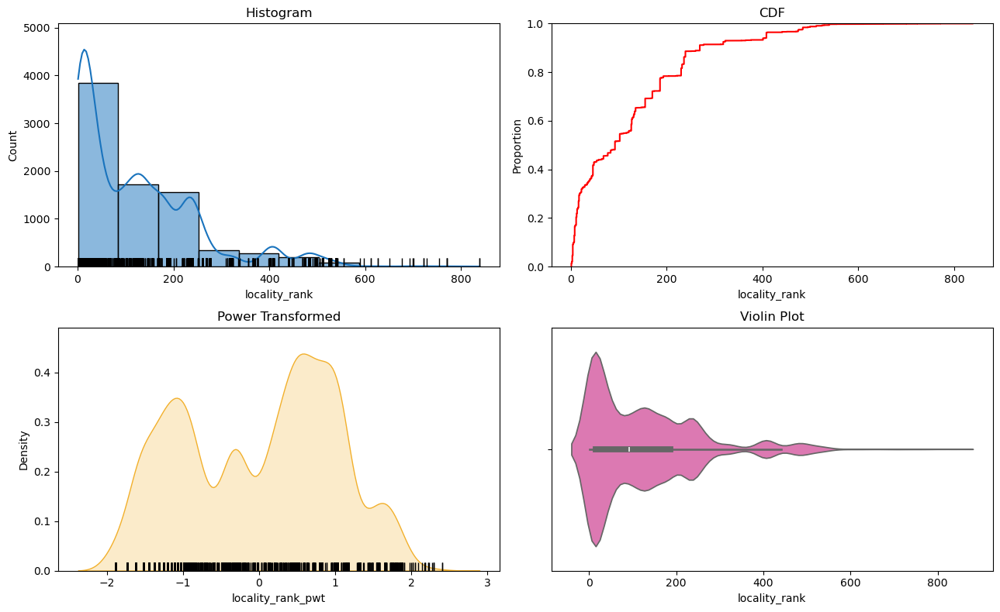

In [38]:
num_univar_plots(df, 'locality_rank', bins=10)

In [39]:
num_summary(df,'locality_rank')

--------------------------------------------------
Percentiles:


,value
percentile,
0,1.0
5,4.0
10,6.0
25,16.0
50,92.0
75,186.0
90,269.0
95,408.0
99,512.0


--------------------------------------------------
Central Tendancy:


,value
mean,122.479767
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,92.000000


--------------------------------------------------
Measure of Spread:


,value
var,16024.608405
std,126.588342
IQR,170.000000
lower_bound,-239.000000
upper_bound,441.000000
mad,79.000000
coef_variance,1.033545


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,1.398247
kurtosis,1.994350


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 1.0966266669437779e-66
Test Statistic       : 0.8439982502755156
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 348.681280376215
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- Skewness (1.398): The data is positively skewed, with a longer tail on the right.  
- Most locality ranks are concentrated at lower values.
- Kurtosis (1.997): The distribution has light tails compared to a normal distribution (kurtosis < 3).  
- Indicates fewer extreme outliers than a heavy-tailed distribution.  

# locality_rating

In [40]:
# no of unique categories and value_counts
analyze_column(df, 'locality_rating', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'locality_rating':


0    3.9
1    4.1
2    4.4
3    3.8
4    3.5
Name: locality_rating, dtype: float64

--------------------------------------------------
Meta-data for 'locality_rating':
Data Type      : float64
Cardinality    : 26
Missing Data   : 463 rows (3.90 %)
Available Data : 11,416 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'locality_rating':


count    11416.000000
mean         3.758926
std          1.068225
min          0.000000
25%          3.900000
50%          4.000000
75%          4.200000
max          5.000000
Name: locality_rating, dtype: float64

--------------------------------------------------
Top Frequent Values in 'locality_rating':


,count,percentage,cum_percent
locality_rating,,,
4.1,2016,17.66,17.66



1 Values in 'locality_rating' with cumulative percentage ≤ 20%:
[4.1]


`observation`
- 464 missing values
- Min locality_rating is 0, max is 5.  
- Mean locality_rating is 3.75, median is 4
- 25% of locality_rating have rating ≤ 3.90; 50% ≤ 4.0.  
- Standard deviation is 1.06; indicating moderate to high variability in ratings.
- Data covers 0–5 continuous rating out of 5 rating.
- 90% of the properties have this ratings [0.0, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4]

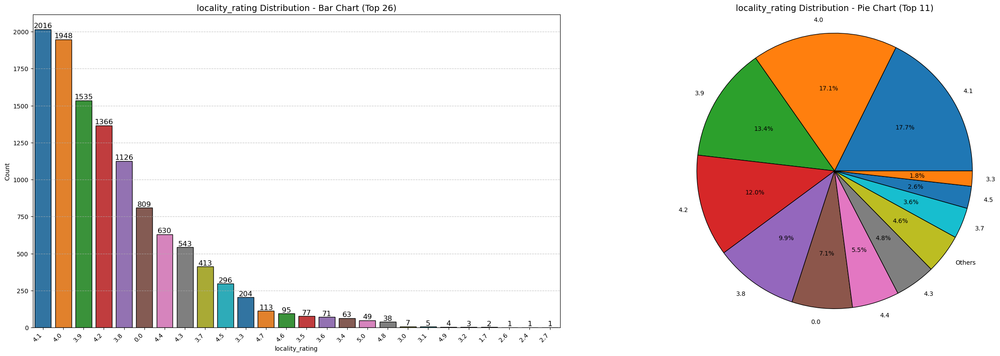

In [41]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'locality_rating', bar_top_n=26, pie_top_n=11)

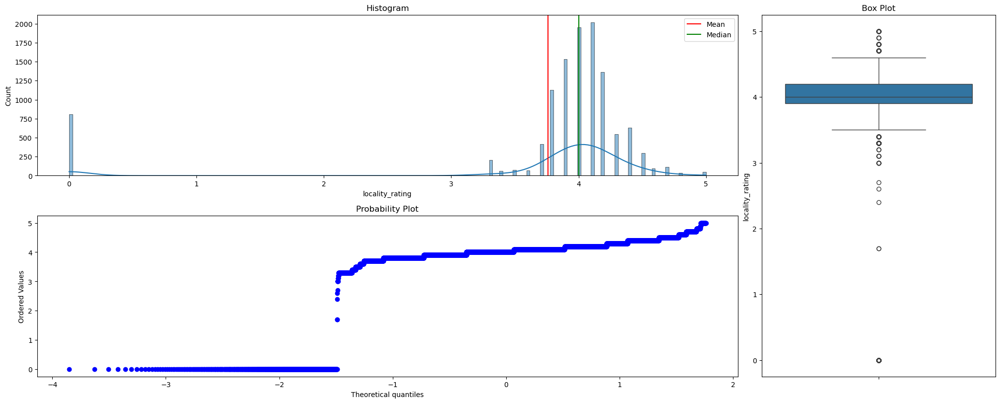

In [42]:
num_three_chart_plot(df, 'locality_rating')

`observation`
- The ratings are concentrated between 3.8 and 4.3, with a peak at 4.0-4.1.
- The distribution is slightly left-skewed, indicating more high ratings than low.
- Outliers at extremes (e.g., 0.0, 1.0, >4.8) are minimal and infrequent.

`observation`
- the iqr blue box lies between 3.90 and 4(50% data)
- the median rank is 4.00
- rating below 3.5 and above 4.65 are outliers
- iqr 0.3 indicate middle 50% of the ratings are tightly clustered, suggesting low variability in this range.
- The distribution is left-skewed, as slightly longer whisker from the lower side

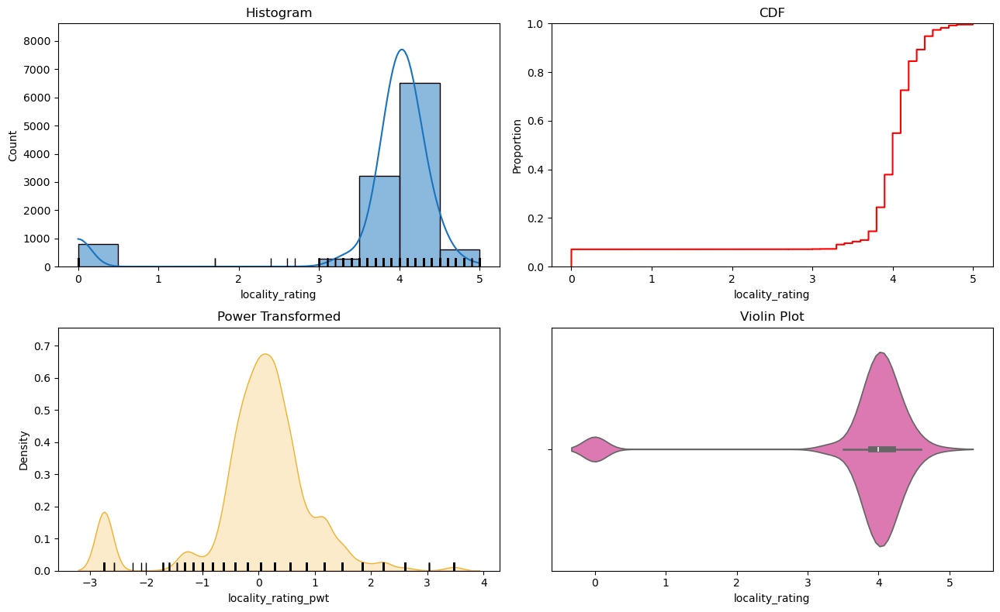

In [43]:
num_univar_plots(df, 'locality_rating', bins=10)

In [44]:
num_summary(df,'locality_rating')

--------------------------------------------------
Percentiles:


,value
percentile,
0,0.0
5,0.0
10,3.5
25,3.9
50,4.0
75,4.2
90,4.4
95,4.5
99,4.7


--------------------------------------------------
Central Tendancy:


,value
mean,3.758926
trimmed mean (5%),3.954138
trimmed mean (10%),4.032898
median,4.000000


--------------------------------------------------
Measure of Spread:


,value
var,1.141105
std,1.068225
IQR,0.300000
lower_bound,3.450000
upper_bound,4.650000
mad,0.200000
coef_variance,0.284184


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,-3.027972
kurtosis,7.917459


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 2.4378803275739616e-101
Test Statistic       : 0.4951599921946266
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 2244.912616858346
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- -3.03 negative skewness indicates strong left-skewed distribution caused by small number of low ratings pulling the tail to the left
- kurtosis > 3 leptokurtic distribution. This reflects a sharp peak and heavy tails, meaning there are more extreme values (outliers) compared to a normal distribution.
- try to apply transformations like reglection transform ,power transform,Box-Cox or Yeo-Johnson Transform

# bath

In [45]:
# no of unique categories and value_counts
analyze_column(df, 'bath', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'bath':


0    2.0
1    3.0
2    2.0
3    2.0
4    2.0
Name: bath, dtype: float64

--------------------------------------------------
Meta-data for 'bath':
Data Type      : float64
Cardinality    : 10
Missing Data   : 30 rows (0.25 %)
Available Data : 11,849 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'bath':


count    11849.000000
mean         2.315638
std          0.963790
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max         10.000000
Name: bath, dtype: float64

--------------------------------------------------
Top Frequent Values in 'bath':


,count,percentage,cum_percent
bath,,,



0 Values in 'bath' with cumulative percentage ≤ 20%:
[]


`observation`  
- from count column we can say that it is imbalance data   
- 3 ways we can handle this as : 1)Group bathrooms ≥6 into one category  
                                 2)If not relevant, consider removing these rows.  
                                 3)Log Transformation – Reduce the impact of large values for better model stability.  

`observation`

- Mean (2.32) ≈ Median (2) → Nearly symmetric distribution.
- Std (0.96) → Moderate spread in values.
- Min (1), Max (10) → Values range from 1 to 10.
- IQR (1) → 50% of values lie between 2 and 3 baths.
- Most common values: Likely 2 or 3 baths, as indicated by 25th and 75th percentiles.
- Potential outliers: Values close to 10 may be outliers
- 30 missing values
- 
below 90% properties have 1,2,3 and 99% of the properties have 1,2,3,4 and 5 bathrooms.- 
55% properties have 2 bathrooms

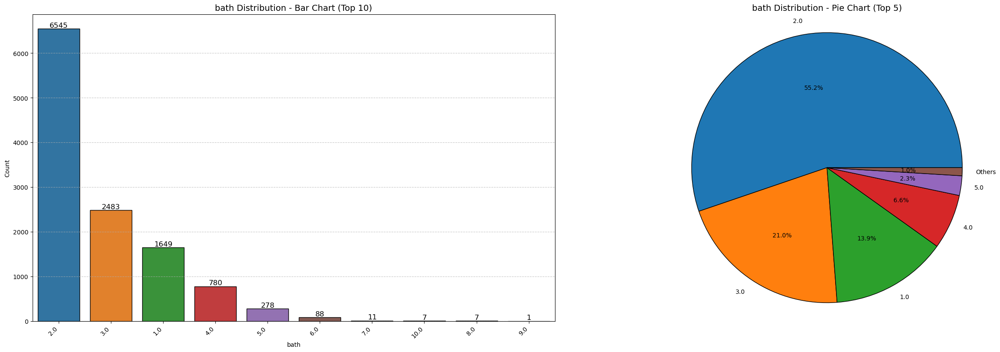

In [46]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'bath', bar_top_n=10, pie_top_n=5)

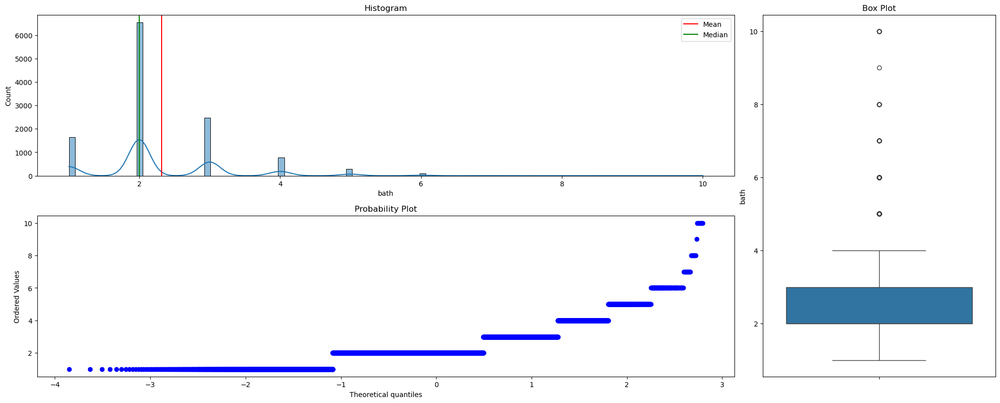

In [47]:
num_three_chart_plot(df, 'bath')

`observation`
- Histogram: Right-skewed, peaks at 2 and 3 baths, outliers inflate the mean.
- Box Plot: Most values 1-4 baths, 6+ are outliers.
- Probability Plot: Discrete distribution, right tail deviates.

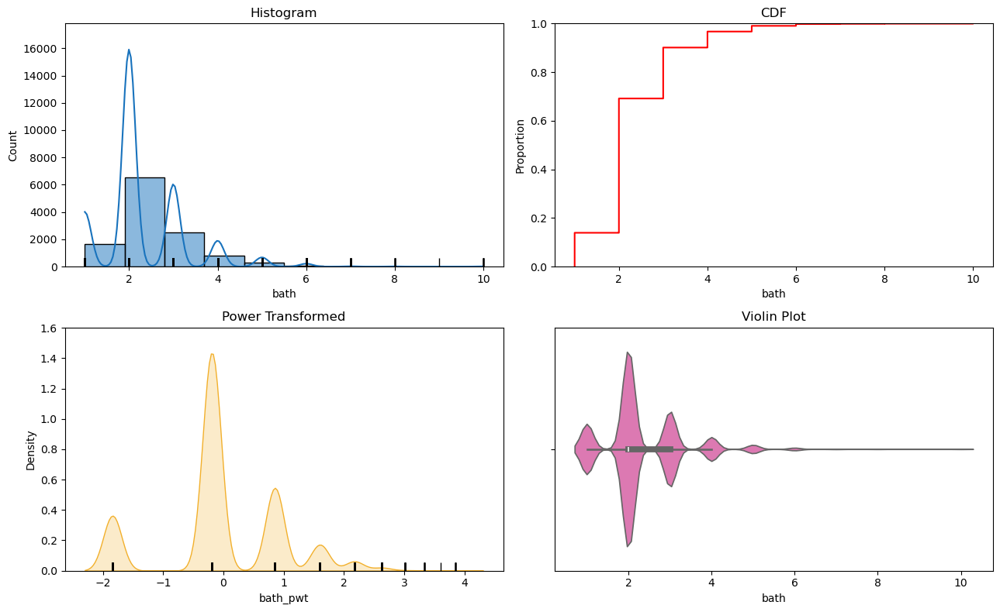

In [48]:
num_univar_plots(df, 'bath', bins=10)

In [49]:
num_summary(df,'bath')

--------------------------------------------------
Percentiles:


,value
percentile,
0,1.0
5,1.0
10,1.0
25,2.0
50,2.0
75,3.0
90,3.0
95,4.0
99,5.0


--------------------------------------------------
Central Tendancy:


,value
mean,2.315638
trimmed mean (5%),2.247358
trimmed mean (10%),2.215781
median,2.000000


--------------------------------------------------
Measure of Spread:


,value
var,0.928892
std,0.963790
IQR,1.000000
lower_bound,0.500000
upper_bound,4.500000
mad,0.000000
coef_variance,0.416209


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,1.530577
kurtosis,4.974354


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 2.9381413512507868e-80
Test Statistic       : 0.8015573460653006
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 928.6843508679758
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- Skewness (1.53): Right-skewed distribution.
- Kurtosis (4.98): Leptokurtic distribution,Higher peak and heavier tails than normal.
- IQR (1.0): Most values between 2 and 3 baths.
- Outliers: Values >4.5 baths are outliers.
- 10th percentile (1.0): 10% have ≤1 bath.
- 75th percentile (3.0): 75% have ≤3 baths.

# parking

In [50]:
# no of unique categories and value_counts
analyze_column(df, 'parking', top_n=5,threshold=100)

--------------------------------------------------
Quick Glance of 'parking':


0    1.0
1    1.0
2    1.0
3    NaN
4    1.0
Name: parking, dtype: float64

--------------------------------------------------
Meta-data for 'parking':
Data Type      : float64
Cardinality    : 10
Missing Data   : 6,224 rows (52.39 %)
Available Data : 5,655 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'parking':


count    5655.000000
mean        1.392573
std         0.722386
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        12.000000
Name: parking, dtype: float64

--------------------------------------------------
Top Frequent Values in 'parking':


,count,percentage,cum_percent
parking,,,
1.0,3952,69.89,69.89
2.0,1350,23.87,93.76
3.0,243,4.30,98.06
4.0,82,1.45,99.51
5.0,17,0.30,99.81



9 Values in 'parking' with cumulative percentage ≤ 100%:
[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 10.0, 9.0, 12.0]


`observation`
- Mean (1.39) ≈ Median (1) → Skewed distribution, more values near 1.
- Std (0.72) → Moderate spread in values.
- Min (1), Max (12) → Values range from 1 to 12.
- Most common value: Likely 1, as indicated by 25th and 50th percentiles.
- Potential outliers: Values close to 12 may be outliers.

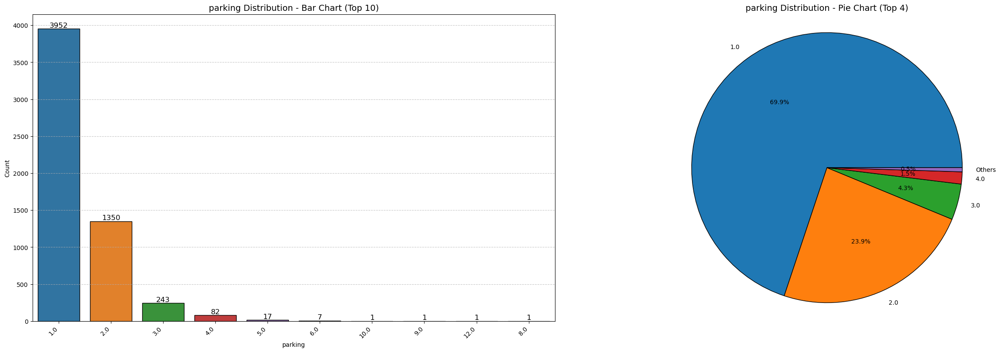

In [51]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'parking', bar_top_n=10, pie_top_n=4)

`observation`
- 6232 missing values
- 70% of properties have only 1 parking followed by 23.8% properties have 2 parking
- feature engineering of the categories which has value_counts less than 7

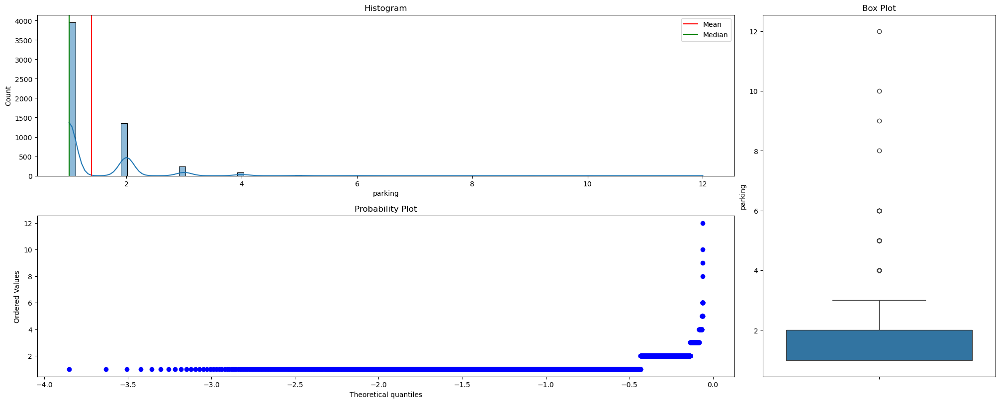

In [52]:
num_three_chart_plot(df, 'parking')

`observation`
- Outliers present, especially for values ≥ 4.
- Most values are concentrated at the lower end.
- 90% of values fall between 1 and 2.

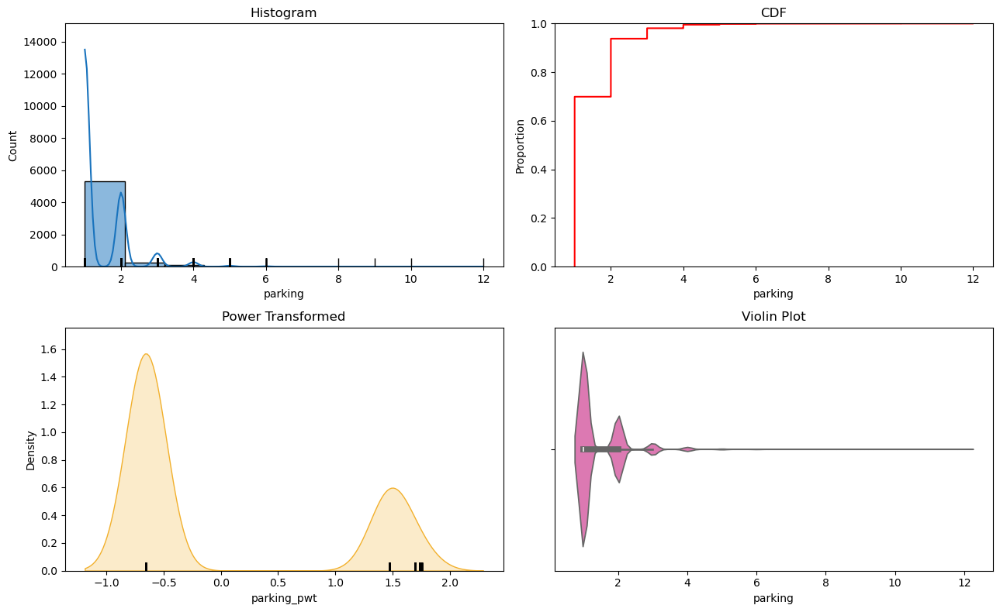

In [53]:
num_univar_plots(df, 'parking', bins=10)

In [54]:
num_summary(df,'parking')

--------------------------------------------------
Percentiles:


,value
percentile,
0,1.0
5,1.0
10,1.0
25,1.0
50,1.0
75,2.0
90,2.0
95,3.0
99,4.0


--------------------------------------------------
Central Tendancy:


,value
mean,1.392573
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,1.000000


--------------------------------------------------
Measure of Spread:


,value
var,0.521841
std,0.722386
IQR,1.000000
lower_bound,-0.500000
upper_bound,3.500000
mad,0.000000
coef_variance,0.518742


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,3.083128
kurtosis,19.837780


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 1.6559874101531774e-79
Test Statistic       : 0.5765627710894135
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.786
Test Statistic       : 912.8284150773543
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- Skewness (3.09) → Strong right skew, confirming a heavy tail on the right.
- Kurtosis (19.86) → Highly peaked distribution, indicating extreme values i.e leptokurtic distribution.

# area

In [55]:
# no of unique categories and value_counts
analyze_column(df, 'area', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'area':


0     635.0
1    1905.0
2     623.0
3     702.0
4     608.0
Name: area, dtype: float64

--------------------------------------------------
Meta-data for 'area':
Data Type      : float64
Cardinality    : 1520
Missing Data   : 5 rows (0.04 %)
Available Data : 11,874 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'area':


count    11874.000000
mean       873.160013
std        576.075417
min        165.000000
25%        540.000000
50%        730.000000
75%       1034.750000
max      12000.000000
Name: area, dtype: float64

--------------------------------------------------
Top Frequent Values in 'area':


,count,percentage,cum_percent
area,,,
650.0,225,1.89,1.89
750.0,207,1.74,3.63
450.0,186,1.57,5.20
700.0,175,1.47,6.67
600.0,144,1.21,7.88



18 Values in 'area' with cumulative percentage ≤ 20%:
[650.0, 750.0, 450.0, 700.0, 600.0, 400.0, 800.0, 850.0, 550.0, 1100.0, 500.0, 1200.0, 900.0, 1000.0, 430.0, 1050.0, 950.0, 680.0]


`observation` 
- 5 missing values
- min area is 3 and max is 40852
- Mean (879.29) > Median (730) → Right-skewed distribution.
- 75% properties have area less than 1035 and max area is 40852, Extreme range, possible outliers.
- Standard deviation is 697.36; high variability. 

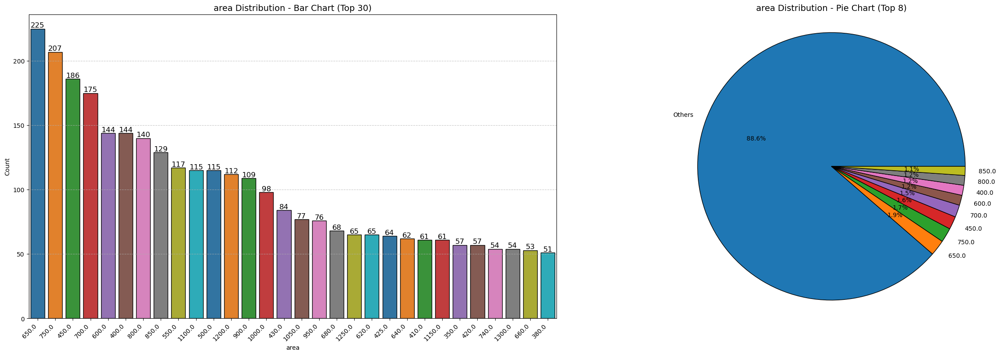

In [56]:
bar_pie_chart_plot(df, 'area', bar_top_n=30, pie_top_n=8)

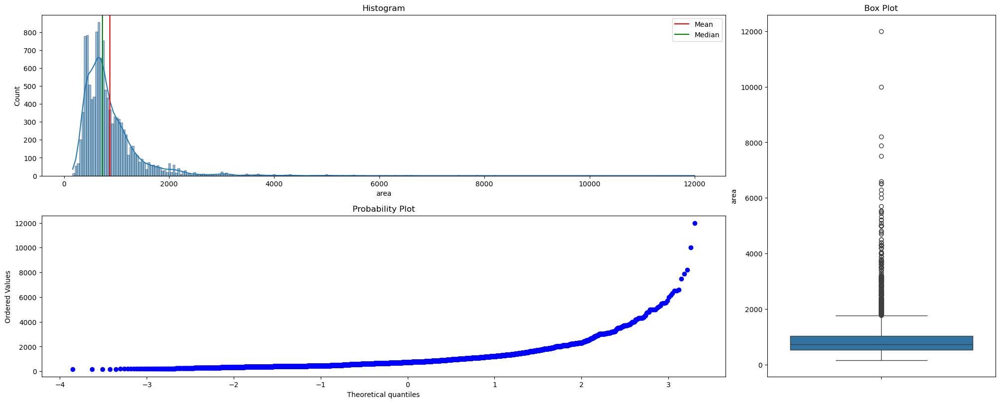

In [57]:
num_three_chart_plot(df, 'area')

`observation` 
- The distribution is right-skewed, with most properties having lower area.
- only 1 outlier make the distribution heavily right-skewed
- the IOR(blue box) lies between area 540 to 1035
- the median area is 730
- The distribution is right-skewed, as evident from the longer whisker on the upper side.
- Most data points are concentrated in the lower area range (1–1500).

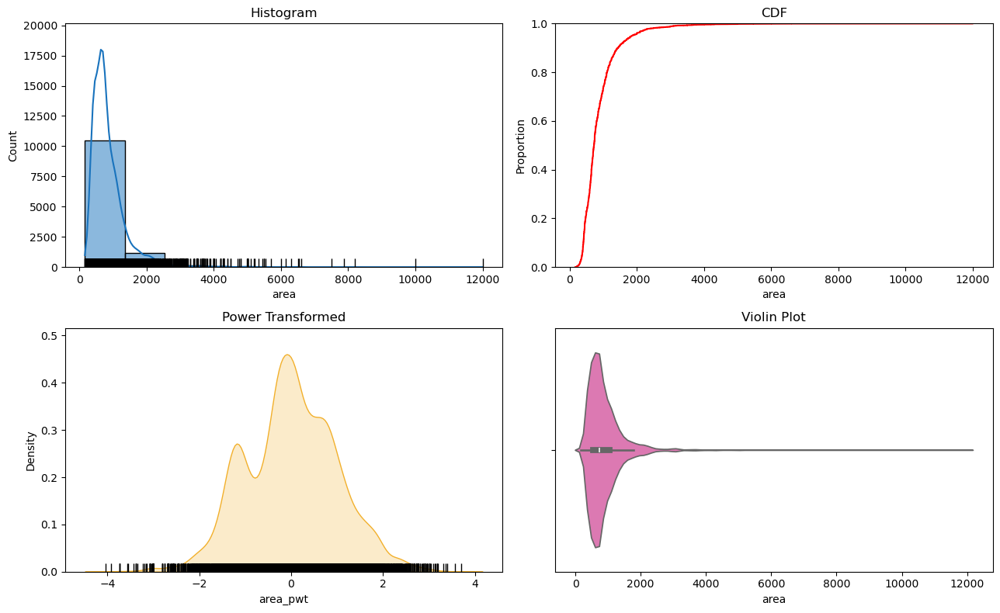

In [58]:
num_univar_plots(df, 'area', bins=10)

In [59]:
num_summary(df,'area')

--------------------------------------------------
Percentiles:


,value
percentile,
0,165.00
5,375.00
10,413.30
25,540.00
50,730.00
75,1034.75
90,1450.00
95,1856.70
99,3100.00


--------------------------------------------------
Central Tendancy:


,value
mean,873.160013
trimmed mean (5%),804.476573
trimmed mean (10%),778.256286
median,730.000000


--------------------------------------------------
Measure of Spread:


,value
var,331862.885536
std,576.075417
IQR,494.750000
lower_bound,-202.125000
upper_bound,1776.875000
mad,240.000000
coef_variance,0.659759


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,4.096048
kurtosis,35.708821


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 2.396929446228162e-89
Test Statistic       : 0.7050128703604444
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 693.0686932859535
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation` 
- Skewness (18.55) → Highly right-skewed, extreme values (outliers) on the higher end.
- Kurtosis (927.63) → Leptokurtic, heavy tails, many outliers.
- Next Steps → Apply transformations(e.g., log or Box-Cox), handle outliers.

# costpersqft

In [60]:
# no of unique categories and value_counts
analyze_column(df, 'costpersqft', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'costpersqft':


0    28346.0
1    12441.0
2    28892.0
3    23500.0
4    20724.0
Name: costpersqft, dtype: float64

--------------------------------------------------
Meta-data for 'costpersqft':
Data Type      : float64
Cardinality    : 7486
Missing Data   : 6 rows (0.05 %)
Available Data : 11,873 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'costpersqft':


count     11873.00000
mean      27792.40981
std       16216.26722
min         289.00000
25%       16923.00000
50%       25586.00000
75%       34286.00000
max      270543.00000
Name: costpersqft, dtype: float64

--------------------------------------------------
Top Frequent Values in 'costpersqft':


,count,percentage,cum_percent
costpersqft,,,
25000.0,64,0.54,0.54
20000.0,59,0.50,1.04
30000.0,47,0.40,1.44
33333.0,36,0.30,1.74
26667.0,35,0.29,2.03



231 Values in 'costpersqft' with cumulative percentage ≤ 20%:
[25000.0, 20000.0, 30000.0, 33333.0, 26667.0, 35000.0, 10000.0, 50000.0, 28000.0, 16667.0, 31250.0, 27778.0, 40000.0, 27000.0, 57673.0, 24000.0, 8000.0, 14000.0, 13333.0, 16000.0, 18000.0, 23333.0, 12500.0, 15000.0, 62500.0, 23077.0, 32000.0, 14286.0, 37500.0, 22500.0, 42000.0, 21429.0, 27273.0, 24444.0, 22222.0, 32051.0, 15385.0, 12000.0, 26316.0, 26000.0, 29412.0, 28571.0, 29167.0, 75000.0, 22000.0, 18750.0, 6667.0, 45000.0, 5000.0, 22727.0, 9000.0, 43750.0, 41667.0, 27500.0, 18182.0, 66667.0, 60000.0, 28889.0, 7500.0, 17500.0, 16981.0, 29000.0, 4000.0, 17857.0, 38462.0, 36000.0, 18333.0, 23000.0, 25714.0, 8333.0, 35714.0, 65000.0, 24286.0, 25455.0, 15750.0, 27143.0, 42857.0, 23256.0, 33750.0, 9333.0, 31667.0, 29231.0, 25641.0, 17000.0, 55000.0, 22917.0, 32500.0, 80000.0, 26900.0, 23673.0, 20223.0, 25430.0, 28169.0, 31818.0, 21667.0, 30556.0, 26923.0, 12857.0, 12222.0, 17143.0, 8182.0, 22857.0, 30769.0, 26744.0, 17692.0, 

`observation`
- range of the sqft ranges from 147.00 sqft to  5333333 sqft
- Mean (28,269) > Median (25,581) → Right-skewed distribution.
- Std (51,409) → High variability in cost per sqft.
- there is much difference between the 75% and max costpersqft,possible outliers

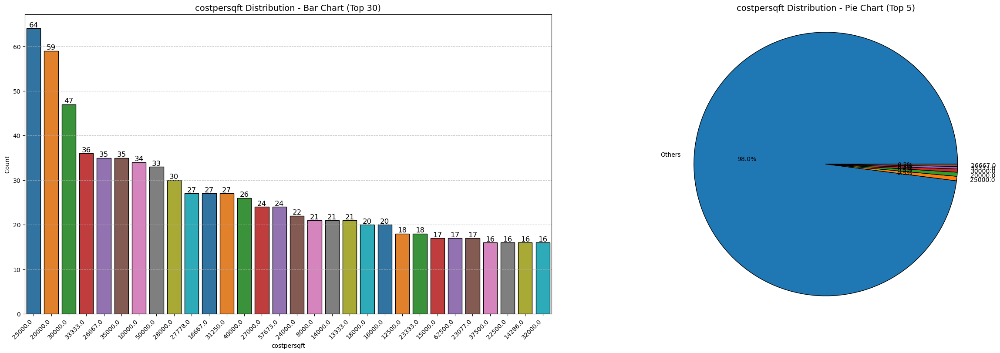

In [61]:
bar_pie_chart_plot(df, 'costpersqft', bar_top_n=30, pie_top_n=5)

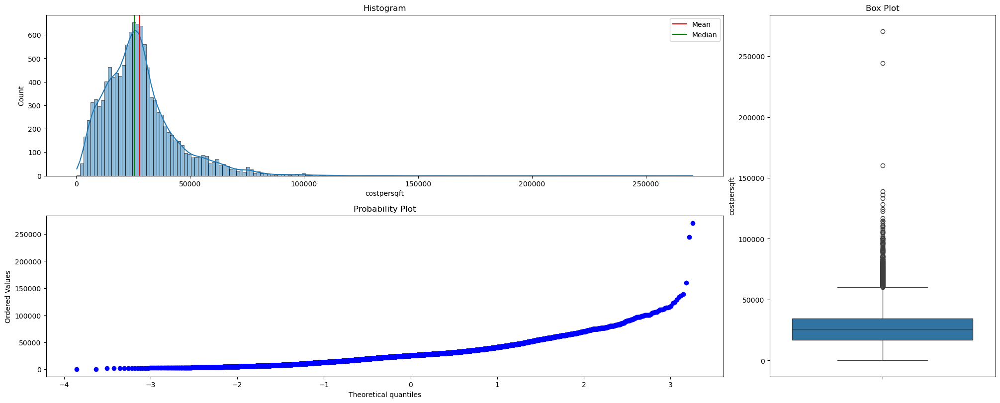

In [62]:
num_three_chart_plot(df, 'costpersqft')

`observation`
- Highly right-skewed distribution (long tail), most data in the lower range.
- Significant outliers present (seen in box plot).
- Mean > Median, confirming skewness.
- QQ plot shows deviation from normality.
- Most data falls within a narrow range, as shown by the small box and whiskers.

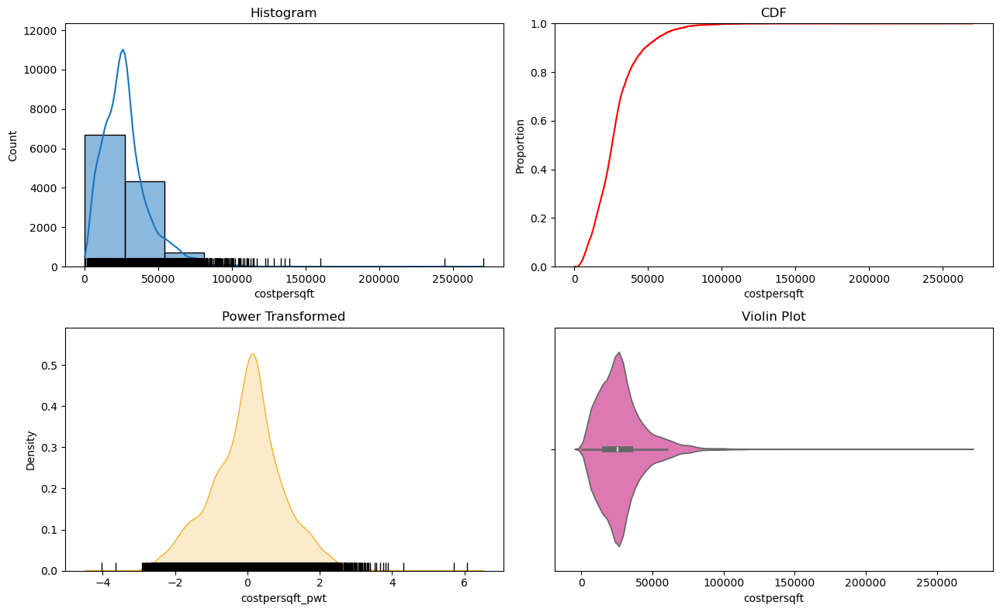

In [63]:
num_univar_plots(df, 'costpersqft', bins=10)

In [64]:
num_summary(df,'costpersqft')

--------------------------------------------------
Percentiles:


,value
percentile,
0,289.00
5,7003.60
10,9917.60
25,16923.00
50,25586.00
75,34286.00
90,48096.20
95,59173.20
99,79957.52


--------------------------------------------------
Central Tendancy:


,value
mean,27792.409810
trimmed mean (5%),26549.371990
trimmed mean (10%),26002.622875
median,25586.000000


--------------------------------------------------
Measure of Spread:


,value
var,2.629673e+08
std,1.621627e+04
IQR,1.736300e+04
lower_bound,-9.121500e+03
upper_bound,6.033050e+04
mad,8.694000e+03
coef_variance,5.834783e-01


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,1.822073
kurtosis,10.126232


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 5.9103152734393933e-67
Test Statistic       : 0.8942942580089759
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 224.24111750834163
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- Few outliers affect the distribution.  
- Positive skewness 92.53 means a right-skewed distribution.  
- kurtosis 9541.83 is highly leptokurtic, means heavy tails and many outliers.

# lift

In [65]:
# no of unique categories and value_counts
analyze_column(df, 'lift', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'lift':


0    4.0
1    4.0
2    2.0
3    NaN
4    3.0
Name: lift, dtype: float64

--------------------------------------------------
Meta-data for 'lift':
Data Type      : float64
Cardinality    : 10
Missing Data   : 5,432 rows (45.73 %)
Available Data : 6,447 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'lift':


count    6447.000000
mean        3.117109
std         1.714704
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max        10.000000
Name: lift, dtype: float64

--------------------------------------------------
Top Frequent Values in 'lift':


,count,percentage,cum_percent
lift,,,



0 Values in 'lift' with cumulative percentage ≤ 20%:
[]


`observation`
- Mean (3.12) < Median (3) → Approximately symmetric distribution.
- Std (1.71) → Moderate variability.
- 25% (2), 75% (4) → 50% of values between 2 and 4.
- Min (1), Max (10) → Range from 1 to 10, no extreme outliers.
- 90% properties have lifts between this 1.0, 2.0, 3.0, 4.0, 5.0

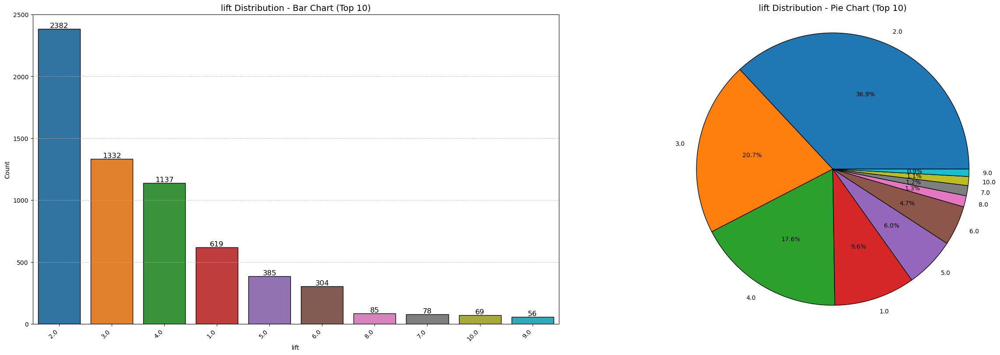

In [66]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'lift', bar_top_n=10, pie_top_n=10) 

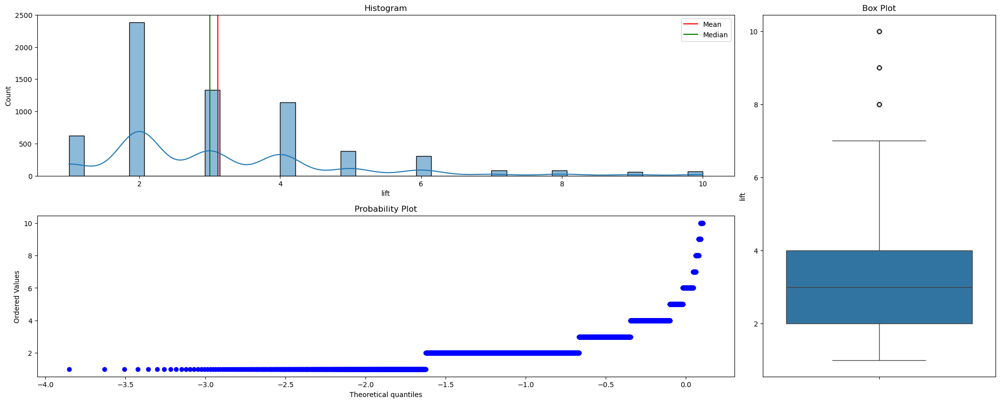

In [67]:
num_three_chart_plot(df, 'lift')

`observation`
- Most data lies between 2 and 4.
- There are a few extreme outliers beyond 6, with the maximum value reaching 10.
- probability plot: The data deviates significantly from a normal distribution, as the points do not follow the straight theoretical line.

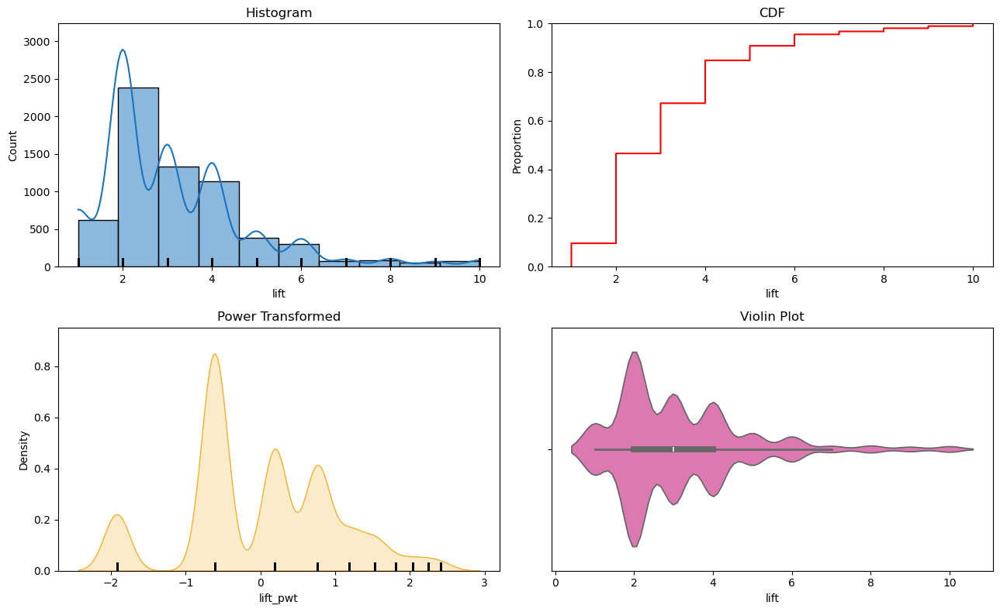

In [68]:
num_univar_plots(df, 'lift', bins=10)

In [69]:
num_summary(df,'lift')

--------------------------------------------------
Percentiles:


,value
percentile,
0,1.0
5,1.0
10,2.0
25,2.0
50,3.0
75,4.0
90,5.0
95,6.0
99,10.0


--------------------------------------------------
Central Tendancy:


,value
mean,3.117109
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,3.000000


--------------------------------------------------
Measure of Spread:


,value
var,2.940208
std,1.714704
IQR,2.000000
lower_bound,-1.000000
upper_bound,7.000000
mad,1.000000
coef_variance,0.550094


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,1.532939
kurtosis,2.937874


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 1.3359804108147333e-62
Test Statistic       : 0.8395967978917817
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 318.3556676896478
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- 5439 missing values 
- 36.97% properties have 2 lifts
- 84% properties have less than 4 lifts
- very few properties have more than 4 lifts

# flat_on_floor

In [70]:
# no of unique categories and value_counts
analyze_column(df, 'flat_on_floor', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'flat_on_floor':


0   NaN
1   NaN
2   NaN
3   NaN
4   NaN
Name: flat_on_floor, dtype: float64

--------------------------------------------------
Meta-data for 'flat_on_floor':
Data Type      : float64
Cardinality    : 71
Missing Data   : 2,291 rows (19.29 %)
Available Data : 9,588 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'flat_on_floor':


count    9588.000000
mean       10.875887
std        10.138626
min        -2.000000
25%         4.000000
50%         8.000000
75%        15.000000
max        75.000000
Name: flat_on_floor, dtype: float64

--------------------------------------------------
Top Frequent Values in 'flat_on_floor':


,count,percentage,cum_percent
flat_on_floor,,,
3.0,676,7.05,7.05
2.0,671,7.00,14.05



2 Values in 'flat_on_floor' with cumulative percentage ≤ 20%:
[3.0, 2.0]


`observation`
- 2292 missing values
- min is -2 and max is 75(below ground there is -1 and -2 and ground floor is 0 and so on till 75th floor we have properties)
- mean is 10.86 and median is 8
- 75% properties are on below 15th floor and max is 75
- std dev is 10.13; high variability
- 90% properties are on this floor - 0 to 23 and 25

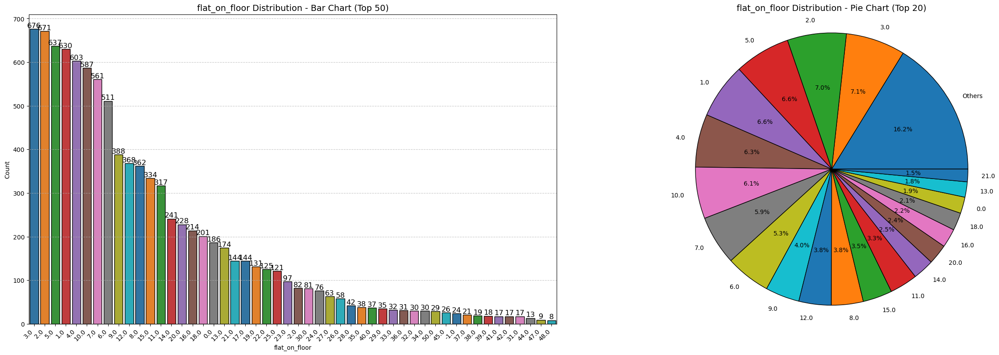

In [71]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'flat_on_floor', bar_top_n=50, pie_top_n=20)

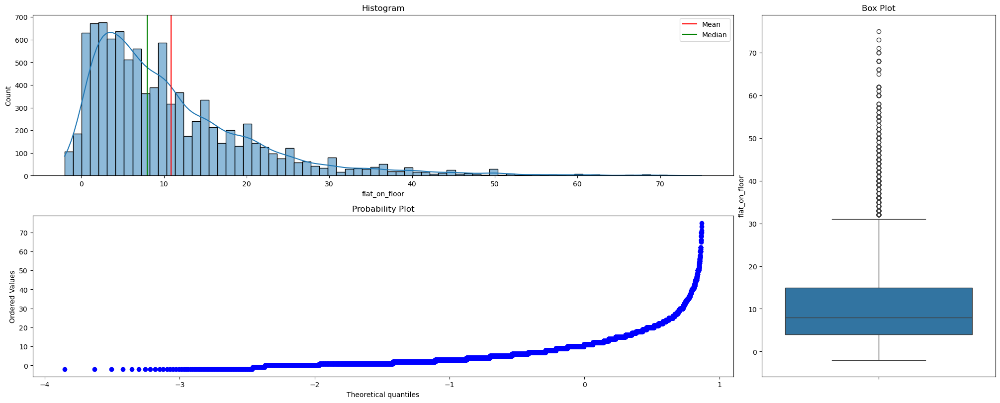

In [72]:
num_three_chart_plot(df, 'flat_on_floor')

`observation` 
- Most flats are concentrated on lower floors (near 0–10).
- The distribution is right-skewed, with fewer flats on higher floors.
- There is a sharp peak around floor 1, indicating a large number of flats on the first floor.
- The data has outliers on higher floors.
- most flats are located on floors within a range of approximately 0–15.
- There are significant outliers above the upper whisker, indicating some flats are on very high floors.
- The interquartile range (IQR) is between floor 4 and floor 15.
- The median floor level is around 8.
- presence of outliers in higher floors.

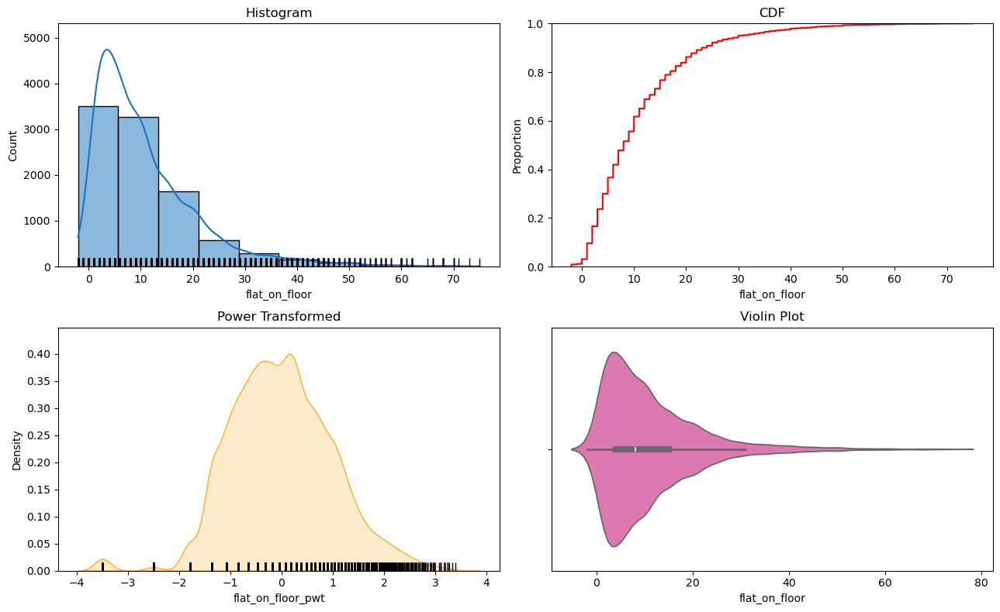

In [73]:
num_univar_plots(df, 'flat_on_floor', bins=10)

In [74]:
 num_summary(df,'flat_on_floor')

--------------------------------------------------
Percentiles:


,value
percentile,
0,-2.00
5,1.00
10,2.00
25,4.00
50,8.00
75,15.00
90,23.00
95,30.00
99,49.13


--------------------------------------------------
Central Tendancy:


,value
mean,10.875887
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,8.000000


--------------------------------------------------
Measure of Spread:


,value
var,102.791729
std,10.138626
IQR,11.000000
lower_bound,-12.500000
upper_bound,31.500000
mad,5.000000
coef_variance,0.932211


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,1.860586
kurtosis,4.730696


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 2.5728960520249795e-71
Test Statistic       : 0.8368958894887953
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 386.6349075820581
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observations` 
- Skewness (1.86): The data is moderately right-skewed, indicating a longer tail towards higher floor levels.  
- Kurtosis (4.73): The data has higher peakedness compared to a normal distribution, with significant outliers on higher floors.  

# total_floor

In [75]:
# no of unique categories and value_counts
analyze_column(df, 'total_floor', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'total_floor':


0     NaN
1     NaN
2     NaN
3    23.0
4     NaN
Name: total_floor, dtype: float64

--------------------------------------------------
Meta-data for 'total_floor':
Data Type      : float64
Cardinality    : 85
Missing Data   : 2,058 rows (17.32 %)
Available Data : 9,821 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'total_floor':


count    9821.000000
mean       22.195703
std        16.218643
min         1.000000
25%         8.000000
50%        19.000000
75%        30.000000
max        92.000000
Name: total_floor, dtype: float64

--------------------------------------------------
Top Frequent Values in 'total_floor':


,count,percentage,cum_percent
total_floor,,,
7.0,1016,10.35,10.35
4.0,552,5.62,15.97



2 Values in 'total_floor' with cumulative percentage ≤ 20%:
[7.0, 4.0]


`observation`
- column for how many floor building has 
- 2059 missing values
- min is 1 and max is 92
- mean is 22.18 and median is 19
- 75% properties are on below 30th floor and max is 92
- std dev is 16.21; high variability
- 90% of the projects consist of buildings with 3 to 40 floors, along with specific buildings having 42, 45, 50, and 60 floors. 
- 80% of the projects have less than 35 floors

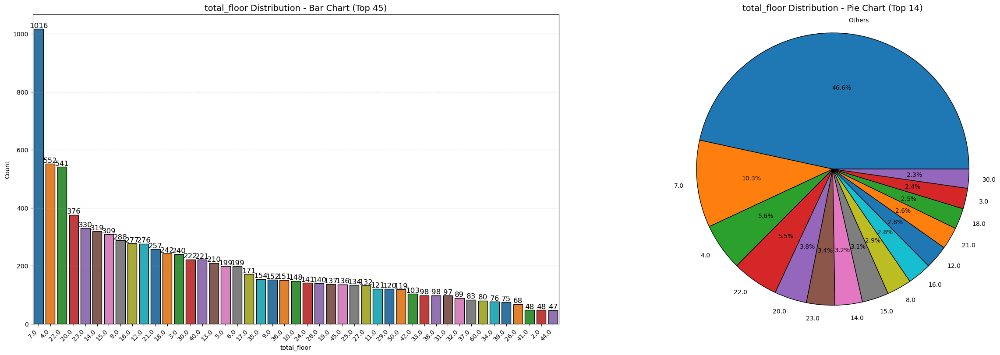

In [76]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'total_floor', bar_top_n=45, pie_top_n=14)

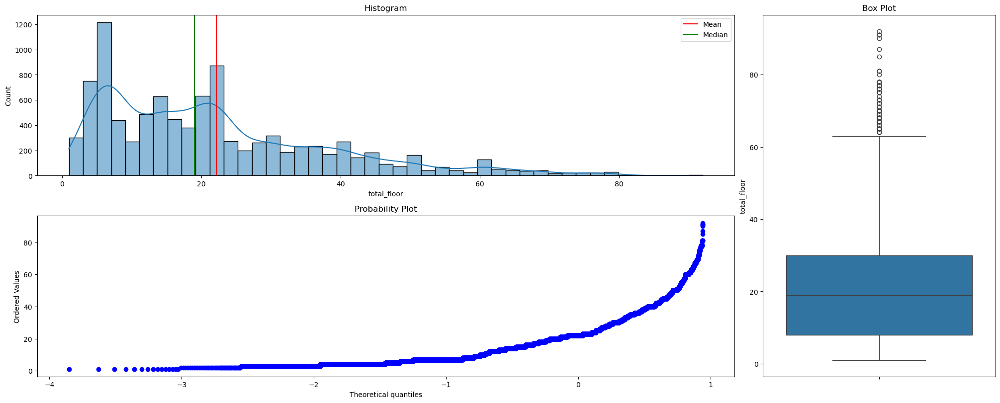

In [77]:
num_three_chart_plot(df, 'total_floor')

`observation` 
- Most projects are concentrated on lower floors (near 1–25).
- The distribution is right-skewed, with fewer projects are of higher floors.
- There is a sharp peak around 7 floor building, indicating most of the buildings are of 7 floor
- The data has outliers for higher floors.
- most projects are located on floors within a range of approximately 0–30.
- There are significant outliers above the upper whisker, indicating some flats are of many floors.
- The interquartile range (IQR) is between floor 8 and floor 30.
- The median project floor level is around 19.
- presence of outliers in higher flat floors.

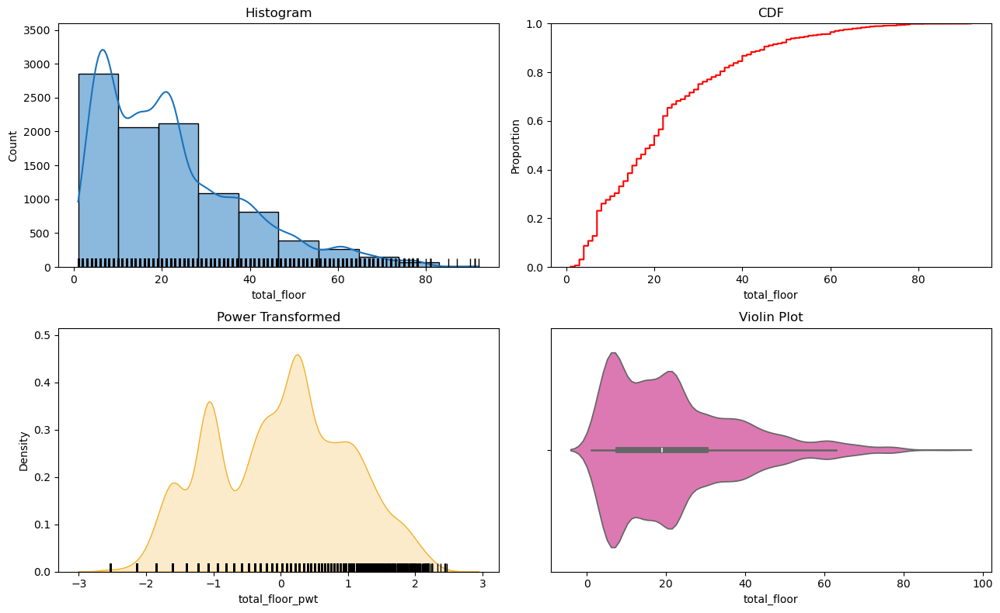

In [78]:
num_univar_plots(df, 'total_floor', bins=10)

In [79]:
num_summary(df,'total_floor')

--------------------------------------------------
Percentiles:


,value
percentile,
0,1.0
5,4.0
10,5.0
25,8.0
50,19.0
75,30.0
90,45.0
95,55.0
99,72.0


--------------------------------------------------
Central Tendancy:


,value
mean,22.195703
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,19.000000


--------------------------------------------------
Measure of Spread:


,value
var,263.044385
std,16.218643
IQR,22.000000
lower_bound,-25.000000
upper_bound,63.000000
mad,11.000000
coef_variance,0.730711


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,1.115416
kurtosis,0.930046


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 1.4622291555166555e-61
Test Statistic       : 0.9022962007188845
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 259.9014299209721
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observations`
- Skewness: 1.11:  
  - The data is moderately positively skewed, indicating that more projects are concentrated at lower floor levels, with a few extreme values on higher floors causing a longer right tail.  
- Kurtosis: 0.93  
  - The data is platykurtic (kurtosis < 3), with lighter tails and fewer extreme outliers.  

# balcony

In [80]:
# no of unique categories and value_counts
analyze_column(df, 'balcony', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'balcony':


0   NaN
1   NaN
2   NaN
3   NaN
4   NaN
Name: balcony, dtype: float64

--------------------------------------------------
Meta-data for 'balcony':
Data Type      : float64
Cardinality    : 8
Missing Data   : 5,812 rows (48.93 %)
Available Data : 6,067 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'balcony':


count    6067.000000
mean        1.846382
std         1.049298
min         1.000000
25%         1.000000
50%         1.000000
75%         3.000000
max         8.000000
Name: balcony, dtype: float64

--------------------------------------------------
Top Frequent Values in 'balcony':


,count,percentage,cum_percent
balcony,,,



0 Values in 'balcony' with cumulative percentage ≤ 20%:
[]


`observation`
- Missing Values (5820) → High missing percentage.
- Mean (1.85) > Median (1) → Right-skewed distribution.
- Std (1.05) → Moderate variability.
- 25% (1), 75% (3) → 50% of values between 1 and 3.
- Min (1), Max (8) → Range from 1 to 8, indicating potential upper outliers.
- 90% of the properties have 1,2,3 balconies.
- 50% properties have 1 balcony

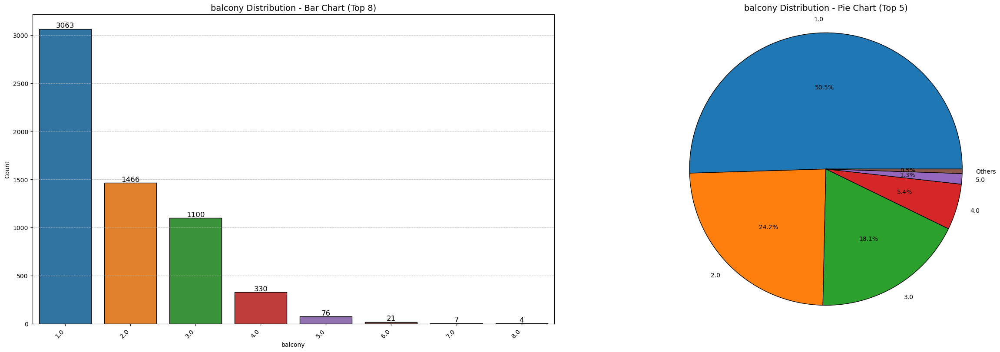

In [81]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'balcony', bar_top_n=8, pie_top_n=5)

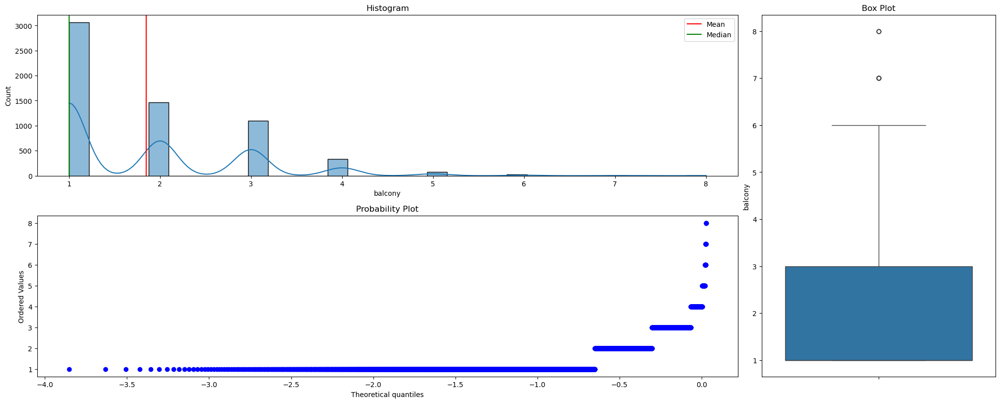

In [82]:
num_three_chart_plot(df, 'balcony')

`observation`
- The histogram shows that the majority of values are concentrated at 1 and 2 balconies.
- The data is highly right-skewed, with few observations for values above 3 balconies.
- The mean is greater than the median, indicating a positive skew.
- The box plot shows outliers for values above 6 balconies.
- Most of the data lies within the interquartile range (1 to 3 balconies).
- The probability plot indicates deviations from normality, especially in the upper tail.

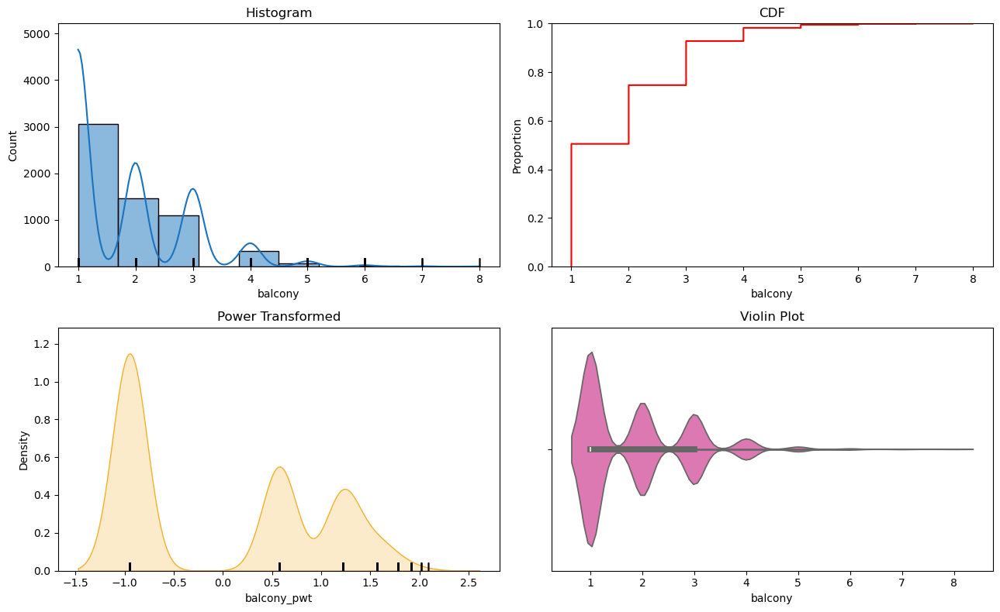

In [83]:
num_univar_plots(df, 'balcony', bins=10)

In [84]:
num_summary(df,'balcony')

--------------------------------------------------
Percentiles:


,value
percentile,
0,1.0
5,1.0
10,1.0
25,1.0
50,1.0
75,3.0
90,3.0
95,4.0
99,5.0


--------------------------------------------------
Central Tendancy:


,value
mean,1.846382
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,1.000000


--------------------------------------------------
Measure of Spread:


,value
var,1.101027
std,1.049298
IQR,2.000000
lower_bound,-2.000000
upper_bound,6.000000
mad,0.000000
coef_variance,0.568300


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,1.272088
kurtosis,1.771138


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 5.893718603499682e-68
Test Statistic       : 0.774955573499347
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.786
Test Statistic       : 518.7255365344072
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation`
- The data is positively skewed with a skewness value of 1.270.
- Kurtosis value of 1.762 indicates a relatively flat distributio(platykurtic).
- The interquartile range (IQR) is 2, with Q1 at 1 and Q3 at 3
- Outliers are present above the upper bound of 6 balconies.

# bed 

In [85]:
# no of unique categories and value_counts
analyze_column(df, 'bed', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'bed':


0    2.0
1    3.0
2    2.0
3    2.0
4    1.0
Name: bed, dtype: float64

--------------------------------------------------
Meta-data for 'bed':
Data Type      : float64
Cardinality    : 9
Missing Data   : 0 rows (0.00 %)
Available Data : 11,879 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'bed':


count    11879.000000
mean         2.162472
std          0.981408
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         10.000000
Name: bed, dtype: float64

--------------------------------------------------
Top Frequent Values in 'bed':


,count,percentage,cum_percent
bed,,,



0 Values in 'bed' with cumulative percentage ≤ 20%:
[]


`observation`
- Most values are between 1 and 3 beds
- std 0.98, indicating variability in the number of beds.
- no missing values
- 92% of the properties have 1, 2, or 3 bedrooms.

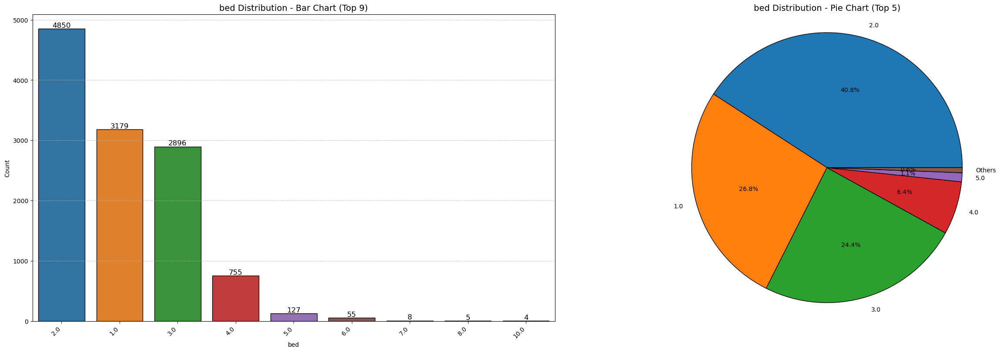

In [86]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'bed', bar_top_n=9, pie_top_n=5)

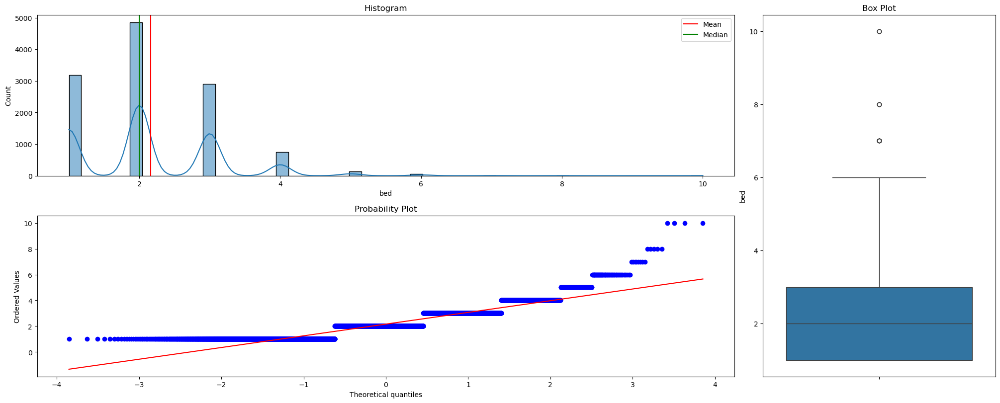

In [87]:
num_three_chart_plot(df, 'bed')

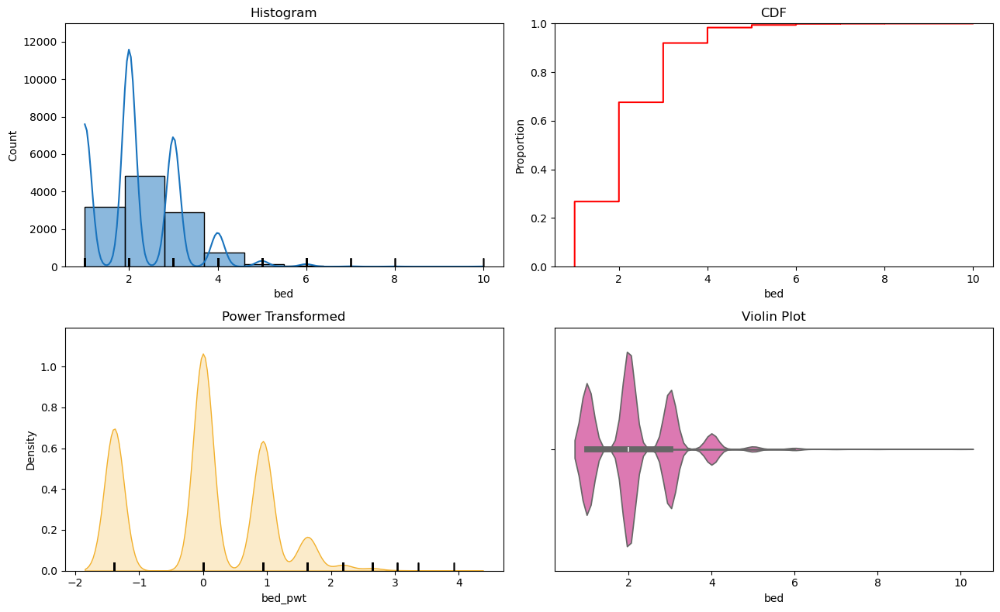

In [88]:
num_univar_plots(df, 'bed', bins=10)

In [89]:
num_summary(df,'bed')

--------------------------------------------------
Percentiles:


,value
percentile,
0,1.0
5,1.0
10,1.0
25,1.0
50,2.0
75,3.0
90,3.0
95,4.0
99,5.0


--------------------------------------------------
Central Tendancy:


,value
mean,2.162472
trimmed mean (5%),2.096512
trimmed mean (10%),2.070594
median,2.000000


--------------------------------------------------
Measure of Spread:


,value
var,0.963161
std,0.981408
IQR,2.000000
lower_bound,-2.000000
upper_bound,6.000000
mad,1.000000
coef_variance,0.453836


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,0.998306
kurtosis,2.563602


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 8.230961799839276e-74
Test Statistic       : 0.8529294276231971
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 605.9913418305787
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`obserbvation`
- Skewness (0.998) → Right-skewed distribution.
- Kurtosis (2.56) → Slightly platykurtic (less peaked than normal).

# lattitude

In [90]:
# no of unique categories and value_counts
analyze_column(df, 'lattitude', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'lattitude':


0    19.207777
1    19.080605
2    19.248778
3    19.138704
4    19.055308
Name: lattitude, dtype: float64

--------------------------------------------------
Meta-data for 'lattitude':
Data Type      : float64
Cardinality    : 2918
Missing Data   : 462 rows (3.89 %)
Available Data : 11,417 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'lattitude':


count    11417.000000
mean        19.144165
std          0.189271
min          9.209138
25%         19.062055
50%         19.143882
75%         19.210299
max         19.832738
Name: lattitude, dtype: float64

--------------------------------------------------
Top Frequent Values in 'lattitude':


,count,percentage,cum_percent
lattitude,,,
19.205002,235,2.06,2.06
19.119677,229,2.01,4.07
19.174954,206,1.80,5.87
19.227262,186,1.63,7.50
19.282975,176,1.54,9.04



13 Values in 'lattitude' with cumulative percentage ≤ 20%:
[19.2050017, 19.1196773, 19.1749536837097, 19.2272619069866, 19.282975, 18.9894007, 19.1154908, 19.1940346300819, 19.1630920855215, 19.2101312179652, 19.0459181155422, 19.1373697481266, 19.0036486667054]


`observation` 
- 463 missing values
- 19.15, close to the median, indicating data is symmetrically distributed.
- std-dev 0.735, showing low variability within most of the data.
- 9.21, indicating a small subset of data significantly lower than the mean.
- 72.88, showing extreme outliers far above the upper whisker.
- 19.06, tightly packed with the 75th Percentile (Q3): 19.21, confirming low IQR.
- Data is heavily skewed due to the extreme max value.

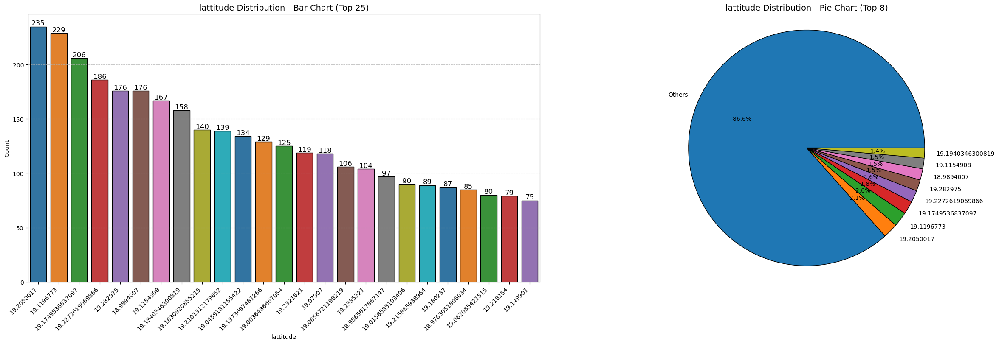

In [91]:
bar_pie_chart_plot(df, 'lattitude', bar_top_n=25, pie_top_n=8)

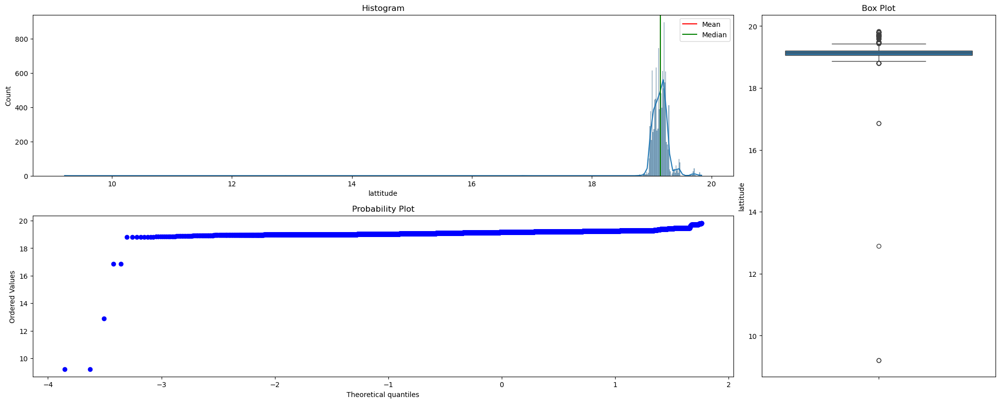

In [92]:
num_three_chart_plot(df, 'lattitude')

`observation`
- The latitude distribution is highly concentrated between 19 and 20.  
- The data is heavily skewed, with minimal values beyond 20.  
- Indicates the dataset is focused on a specific geographical region.
- Values outside the whiskers are considered outliers.
- The latitude data is concentrated within a narrow interquartile range (IQR) near 10–20.
- The median latitude lies close to 19.

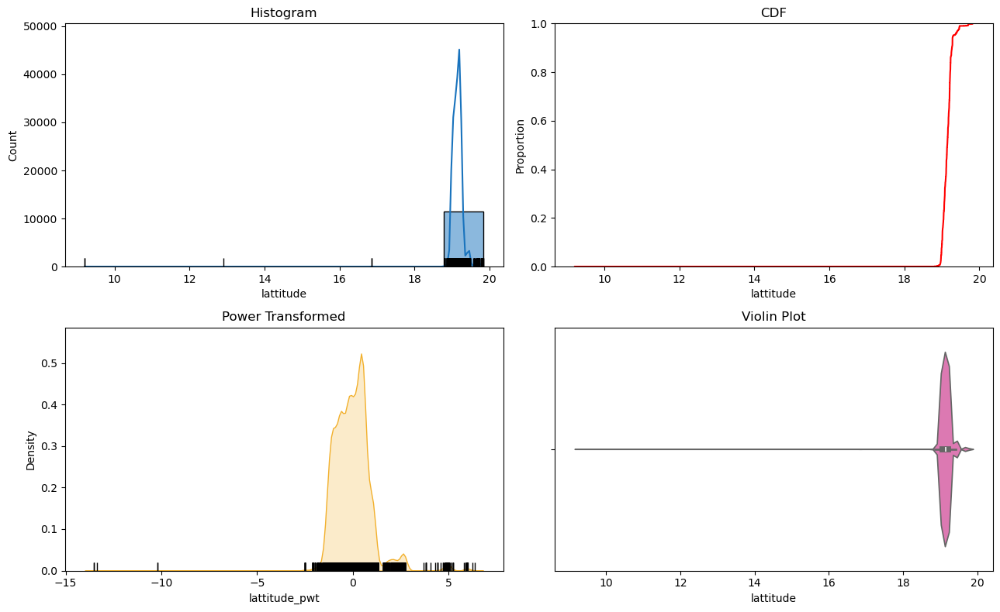

In [93]:
num_univar_plots(df, 'lattitude', bins=10)

In [94]:
num_summary(df,'lattitude')

--------------------------------------------------
Percentiles:


,value
percentile,
0,9.209138
5,18.986562
10,19.003649
25,19.062055
50,19.143882
75,19.210299
90,19.269177
95,19.303104
99,19.471987


--------------------------------------------------
Central Tendancy:


,value
mean,19.144165
trimmed mean (5%),19.150471
trimmed mean (10%),19.145721
median,19.143882


--------------------------------------------------
Measure of Spread:


,value
var,0.035824
std,0.189271
IQR,0.148243
lower_bound,18.839691
upper_bound,19.432664
mad,0.072984
coef_variance,0.009887


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,-28.462403
kurtosis,1436.446279


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 1.952096544138888e-104
Test Statistic       : 0.429051954139291
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 711.1459444771081
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation` 
- Skewness (67.71): Extremely positively skewed distribution with a long right tail.  
- Kurtosis (4986.76): Highly leptokurtic, with a sharp peak and heavy tails.  
- Most values are concentrated between 10°–20°, with a few extreme outliers above 50°.  
- Indicates the need for transformations (e.g., log, Box-Cox) or outlier treatment.

# longitude

In [95]:
# no of unique categories and value_counts
analyze_column(df, 'longitude', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'longitude':


0    72.967479
1    73.073939
2    72.863793
3    72.859964
4    72.922850
Name: longitude, dtype: float64

--------------------------------------------------
Meta-data for 'longitude':
Data Type      : float64
Cardinality    : 2853
Missing Data   : 462 rows (3.89 %)
Available Data : 11,417 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'longitude':


count    11417.000000
mean        72.905797
std          0.087731
min         72.704548
25%         72.839809
50%         72.872695
75%         72.963282
max         74.021019
Name: longitude, dtype: float64

--------------------------------------------------
Top Frequent Values in 'longitude':


,count,percentage,cum_percent
longitude,,,
72.869271,287,2.51,2.51
72.905081,229,2.01,4.52
72.943104,206,1.80,6.32
72.863440,186,1.63,7.95
73.117516,176,1.54,9.49



13 Values in 'longitude' with cumulative percentage ≤ 20%:
[72.8692711, 72.9050809, 72.943103519999, 72.8634397272398, 73.1175162, 72.873618, 72.8726952, 72.8257561606587, 72.8398088005091, 72.8305011930765, 72.8975231581492, 72.8257229439874, 72.8175254882335]


`observation` 
- mean close to median indicating data is symmetrically distributed
- std-dev 0.716, showing relatively low variability within the dataset.
- 19.02, an extreme outlier far below the majority of values.
- 74.02, close to the mean, suggesting no extreme positive outliers.
- 25th Percentile (Q1): 72.84 and 75th Percentile (Q3): 72.96, with a narrow IQR of approximately 0.12, indicating tightly packed data.
- The outlier at the lower bound (19.02) significantly skews the distribution.

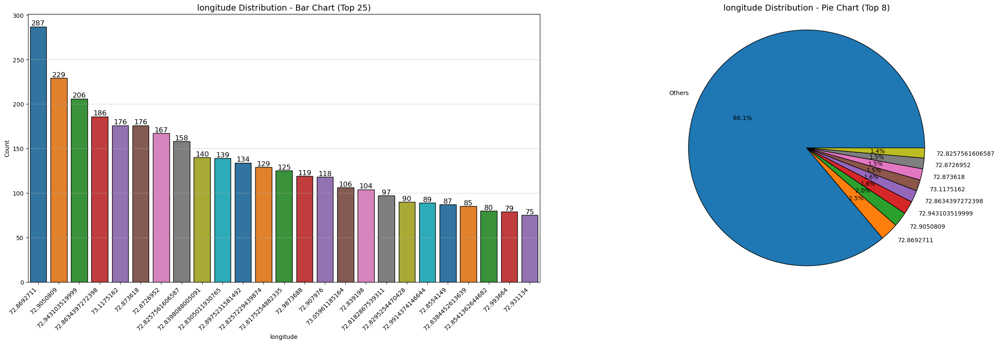

In [96]:
bar_pie_chart_plot(df, 'longitude', bar_top_n=25, pie_top_n=8)

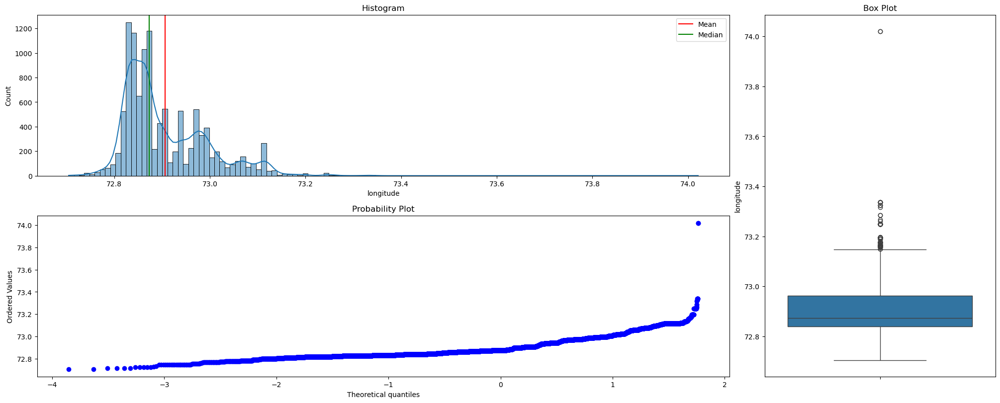

In [97]:
num_three_chart_plot(df, 'longitude')

`observation` 
- Majority of longitude values are concentrated near 70.
- Sparse distribution of values below 70.
- Outliers or minimal data points in lower longitude ranges.
- Most longitude values lie within a narrow range near the upper end (around 70).
- A few outliers are present, significantly lower than the main cluster (around 20).

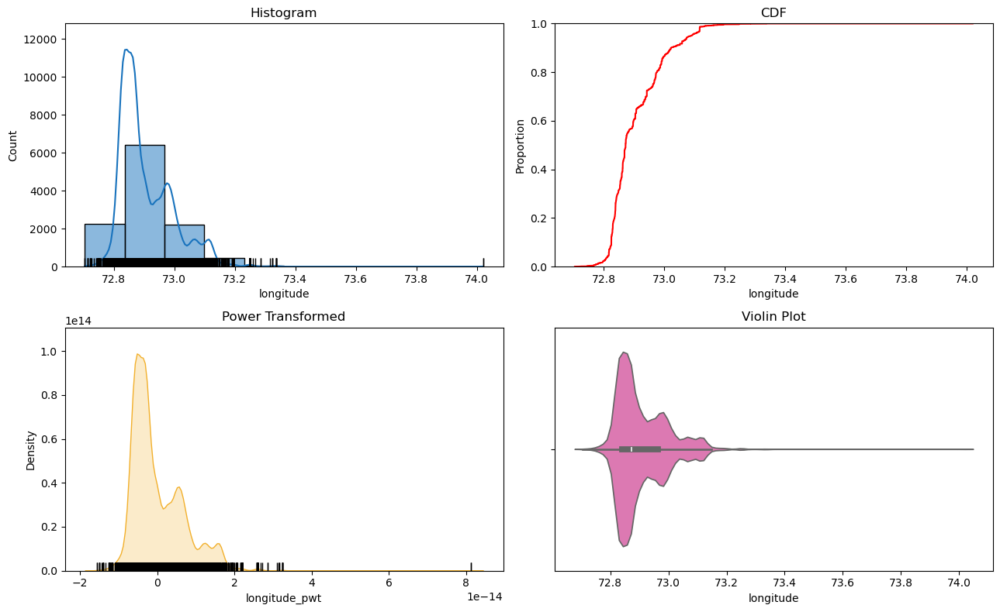

In [98]:
num_univar_plots(df, 'longitude', bins=10)

In [99]:
num_summary(df,'longitude')

--------------------------------------------------
Percentiles:


,value
percentile,
0,72.704548
5,72.817525
10,72.825723
25,72.839809
50,72.872695
75,72.963282
90,73.023035
95,73.089879
99,73.136714


--------------------------------------------------
Central Tendancy:


,value
mean,72.905797
trimmed mean (5%),72.908181
trimmed mean (10%),72.901411
median,72.872695


--------------------------------------------------
Measure of Spread:


,value
var,0.007697
std,0.087731
IQR,0.123473
lower_bound,72.654600
upper_bound,73.148491
mad,0.042781
coef_variance,0.001203


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,1.451495
kurtosis,5.430824


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 5.73430206534288e-68
Test Statistic       : 0.8843373763199807
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 408.93719347203296
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation` 
- Skewness (1.451495):  
  - The negative skewness indicates a right-skewed distribution.
  - This aligns with the presence of outliers at the lower longitude range, as seen in the boxplot.
- Kurtosis (5.43):
  - The kurtosis value suggests the distribution has heavy tails and a sharp peak.
  - This indicates most of the data is tightly concentrated near the central value (around 70), with a few extreme outliers contributing to the heavy tails.
- Indicates the need for transformations (e.g., log, Box-Cox) or outlier treatment.

# emi

In [100]:
# no of unique categories and value_counts
analyze_column(df, 'emi', top_n=5,threshold=20)

--------------------------------------------------
Quick Glance of 'emi':


0    0.81
1    1.07
2    0.81
3    0.74
4    0.57
Name: emi, dtype: float64

--------------------------------------------------
Meta-data for 'emi':
Data Type      : float64
Cardinality    : 589
Missing Data   : 2 rows (0.02 %)
Available Data : 11,877 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'emi':


count    11877.000000
mean         1.312566
std          1.912632
min          0.007450
25%          0.430000
50%          0.800000
75%          1.440000
max         36.080000
Name: emi, dtype: float64

--------------------------------------------------
Top Frequent Values in 'emi':


,count,percentage,cum_percent
emi,,,
0.41,173,1.46,1.46
0.50,169,1.42,2.88
0.56,164,1.38,4.26
0.32,163,1.37,5.63
0.90,162,1.36,6.99



15 Values in 'emi' with cumulative percentage ≤ 20%:
[0.41, 0.5, 0.56, 0.32, 0.9, 0.45, 0.54, 0.63, 0.81, 0.43, 1.13, 0.68, 0.34, 0.79, 0.27]


`observation` 
- EMI values for flat purchases, measured in lakhs.
- 2 missing values
- EMIs range from ₹745 (min) to ₹36.08 lakh (max).
- Mean EMI is ₹1.31 lakh; median is ₹0.80 lakh.
- 75% of borrowers have an EMI of ₹1.44 lakh (₹1,44,000) or less.
- High standard deviation (₹1.91 lakh) indicates wide variation.
- Data is right-skewed, with some very high EMIs.

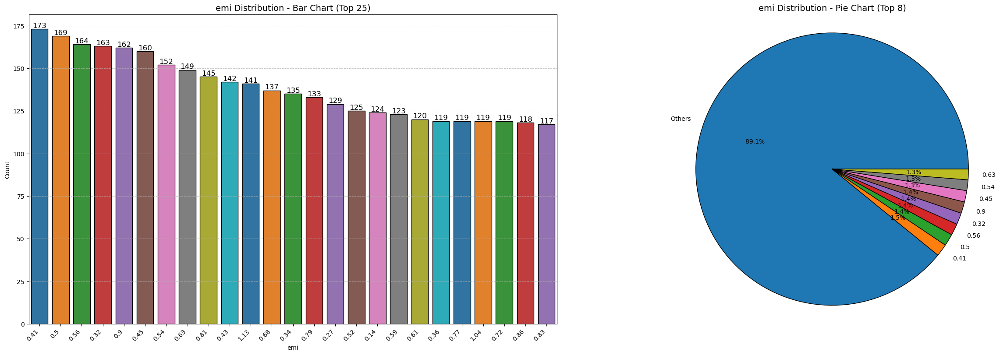

In [101]:
bar_pie_chart_plot(df, 'emi', bar_top_n=25, pie_top_n=8)

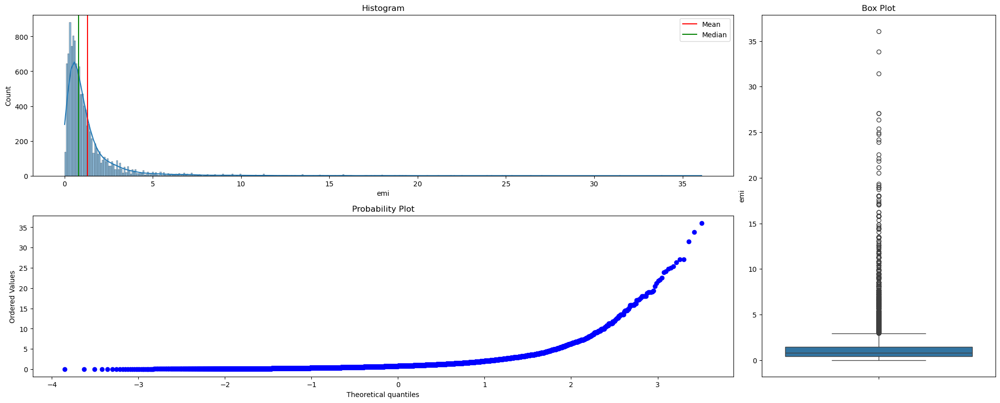

In [102]:
num_three_chart_plot(df, 'emi')

`observation`
- Most borrowers pay lower EMIs, likely below ₹2 lakh.
- The tail includes outliers, such as the maximum EMI of ₹36.08 lakh.
- A log transformation or outlier handling might be useful for further analysis.
- significant right skewness in the data.
- outliers are beyond the upper whisker, including extreme values like ₹36.08 lakh.
- The box (IQR) is narrow, indicating that the middle 50% of data points (25th to 75th percentile) are tightly packed between ₹0.43 lakh and ₹1.44 lakh.
- median EMI (₹0.80 lakh) lies closer to the lower quartile, reflecting the skewed distribution.

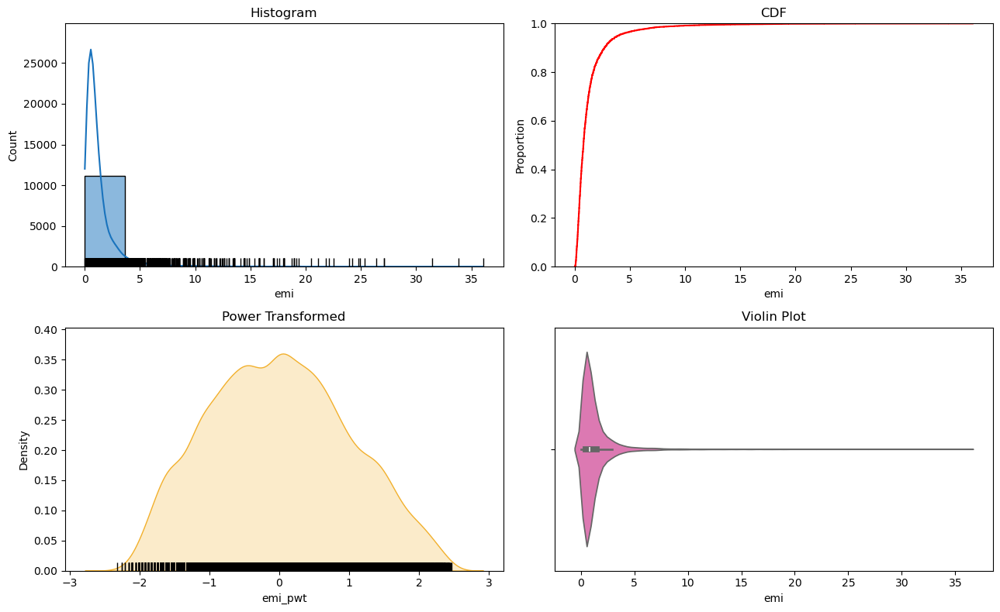

In [103]:
num_univar_plots(df, 'emi', bins=10)

In [104]:
num_summary(df,'emi')

--------------------------------------------------
Percentiles:


,value
percentile,
0,0.00745
5,0.16000
10,0.24000
25,0.43000
50,0.80000
75,1.44000
90,2.71000
95,3.95000
99,9.47000


--------------------------------------------------
Central Tendancy:


,value
mean,1.312566
trimmed mean (5%),1.033844
trimmed mean (10%),0.949268
median,0.800000


--------------------------------------------------
Measure of Spread:


,value
var,3.658163
std,1.912632
IQR,1.010000
lower_bound,-1.085000
upper_bound,2.955000
mad,0.440000
coef_variance,1.457170


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,6.194052
kurtosis,60.850533


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 5.656998032038502e-102
Test Statistic       : 0.5035045469923269
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 1443.3683392060539
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation` 
- Skewness (6.19): Highly right-skewed distribution with a long tail of high EMI values.
- Kurtosis (60.88): Leptokurtic distribution with a sharp peak and heavy tails, indicating many outliers.

# project_in_acres

In [105]:
# no of unique categories and value_counts
analyze_column(df, 'project_in_acres', top_n=20, threshold=90)

--------------------------------------------------
Quick Glance of 'project_in_acres':


0     1.3006
1    17.0000
2     1.0000
3     1.0000
4     2.0000
Name: project_in_acres, dtype: float64

--------------------------------------------------
Meta-data for 'project_in_acres':
Data Type      : float64
Cardinality    : 207
Missing Data   : 5,741 rows (48.33 %)
Available Data : 6,138 / 11,879 rows
--------------------------------------------------
Descriptive Statistics for 'project_in_acres':


count     6138.000000
mean        27.393366
std        729.142485
min          0.000000
25%          1.000000
50%          3.000000
75%          8.499900
max      55000.000000
Name: project_in_acres, dtype: float64

--------------------------------------------------
Top Frequent Values in 'project_in_acres':


,count,percentage,cum_percent
project_in_acres,,,
1.0,1287,20.97,20.97
2.0,788,12.84,33.81
3.0,516,8.41,42.22
4.0,418,6.81,49.03
6.0,284,4.63,53.66
5.0,282,4.59,58.25
8.0,212,3.45,61.70
7.0,203,3.31,65.01
27.0,133,2.17,67.18



36 Values in 'project_in_acres' with cumulative percentage ≤ 90%:
[1.0, 2.0, 3.0, 4.0, 6.0, 5.0, 8.0, 7.0, 27.0, 40.0, 18.0, 10.0, 12.0, 32.0, 17.0, 14.0, 250.0, 36.0, 9.0, 16.0, 22.0, 105.0, 25.0, 15.0, 0.2617, 30.0, 3.0493, 11.0, 20.0, 68.0, 1.1246, 13.0, 0.0, 0.3049, 0.5807, 23.0]


`observation` 
- project built on the land in acres
- 5750 missing values
- ranges from 0 to 55000
- mean is 27.37 acre and median is 3 acre
- 75% properties have built on land 8.49acre or less
- high std-dev indicates high variation
- data is right skewed with extreme high acres values 

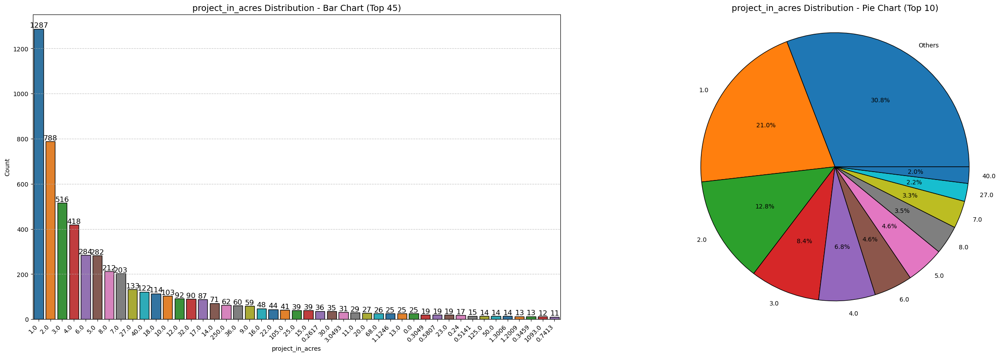

In [106]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'project_in_acres', bar_top_n=45, pie_top_n=10)

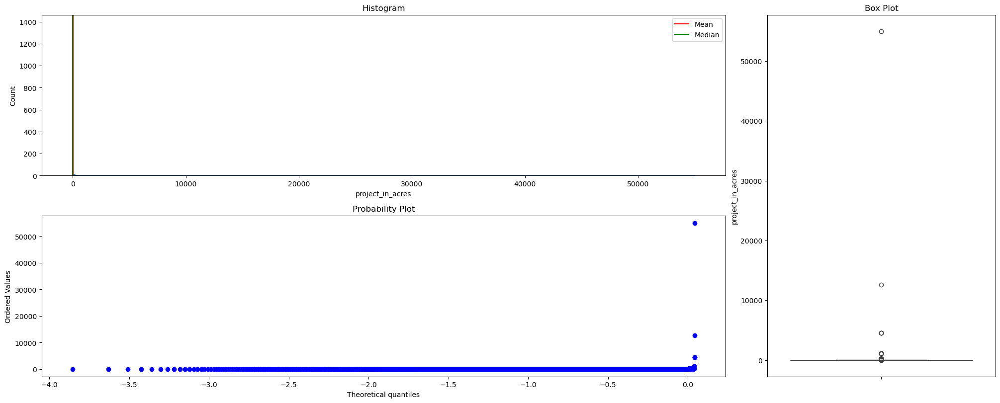

In [107]:
num_three_chart_plot(df, 'project_in_acres')

`observation` 
- Highly right-skewed.  
  Most projects have small acre land.  
- few projects with extremely high acre land (>10,000 acres).  
- Large variation in project sizes.
- Extreme values above 10,000 acres 
- most data concentrated near lower values.  
- High range with a few projects occupying vast land.

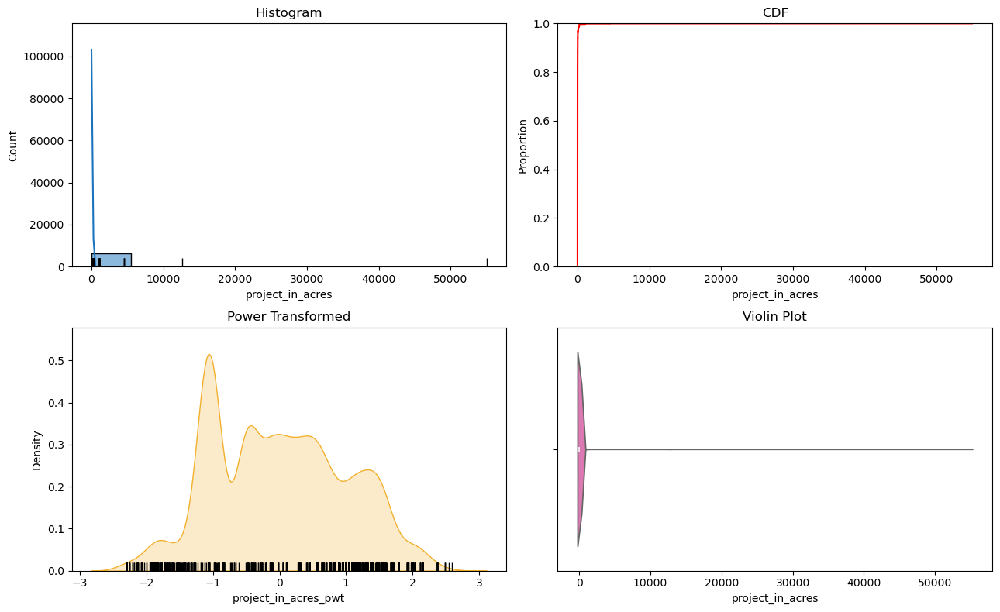

In [108]:
num_univar_plots(df, 'project_in_acres', bins=10)

In [109]:
num_summary(df,'project_in_acres')

--------------------------------------------------
Percentiles:


,value
percentile,
0,0.0000
5,0.5807
10,1.0000
25,1.0000
50,3.0000
75,8.4999
90,27.0000
95,40.0000
99,250.0000


--------------------------------------------------
Central Tendancy:


,value
mean,27.393366
trimmed mean (5%),NaN
trimmed mean (10%),NaN
median,3.000000


--------------------------------------------------
Measure of Spread:


,value
var,531648.762952
std,729.142485
IQR,7.499900
lower_bound,-10.249850
upper_bound,19.749750
mad,2.000000
coef_variance,26.617484


--------------------------------------------------
Skewness and Kurtosis:


,value
skewness,70.815128
kurtosis,5282.188762


--------------------------------------------------
Hypothesis Testing for Normality:
Shapiro-Wilk Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 3.42866566110261e-101
Test Statistic       : 0.01018299429038394
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed
--------------------------------------------------
Anderson-Darling Test:
Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.786
Test Statistic       : 2240.2917609207125
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


`observation` 
- Skewness: 70.84, highly right-skewed distribution.  
- Kurtosis: 5287.34, sharp peaks and heavy tails due to outliers.  
- Data has extreme outliers, requiring transformation or outlier handling.  

# Univariate analysis on Categorical columns

In [110]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)
print("-" * 100)
print(f'Total categorical columns: {len(categorical_columns)}')

Index(['id', 'url', 'image', 'name', 'wholeaddress', 'address', 'flooring',
       'image_urls', 'am_12204', 'am_12226',
       ...
       'status', 'facing', 'seller', 'price_category', 'education',
       'transport', 'shopping_centre', 'commercial_hub', 'hospital',
       'tourist'],
      dtype='object', length=161)
----------------------------------------------------------------------------------------------------
Total categorical columns: 161


# construction

In [111]:
cat_summary(df, 'construction', top_n=8, threshold=100)  

--------------------------------------------------
Quick Glance:


0    under construction
1    under construction
2    under construction
3    under construction
4    under construction
Name: construction, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 7 categories
Missing Data   : 1,054 rows (8.87 %)
Available Data : 10,825 / 11,879 rows
--------------------------------------------------
summary:


,
count,10825
unique,7
top,under construction
freq,4554


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
under construction,4554,42.07,42.07
less than 5 years,1506,13.91,55.98
new construction,1467,13.55,69.53
5 to 10 years,1403,12.96,82.49
10 to 15 years,943,8.71,91.20
above 20 years,494,4.56,95.76
15 to 20 years,458,4.23,99.99



7 Categories in 'construction' with cumulative percentage ≤ 100%:
['under construction', 'less than 5 years', 'new construction', '5 to 10 years', '10 to 15 years', 'above 20 years', '15 to 20 years']


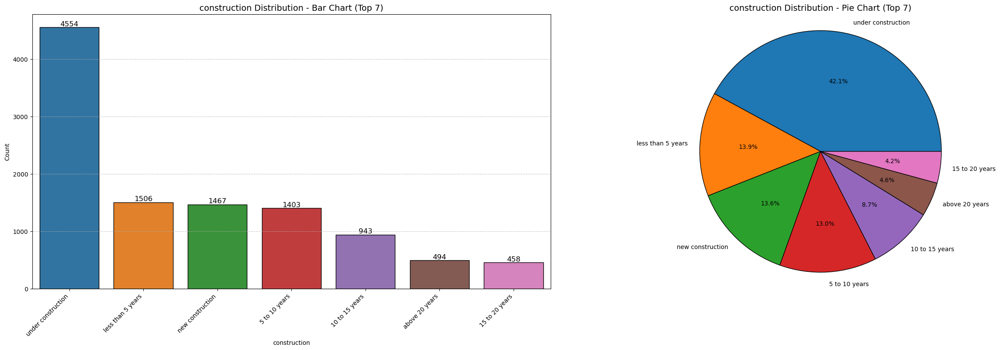

In [112]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'construction', bar_top_n=7, pie_top_n=7)

`observation` 
- 1056 missing values
- 3305 properties are older more than 5 years
- 1509 properties are less than 5 years old
- 4557 are under construction properties
- 1467 are new construction properties
- 42% properties are under construction and all other are completed properties
- make above 10 years as separate category 

# overlooking

In [113]:
cat_summary(df, 'overlooking', top_n=7, threshold=90)

--------------------------------------------------
Quick Glance:


0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: overlooking, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 7 categories
Missing Data   : 3,956 rows (33.30 %)
Available Data : 7,923 / 11,879 rows
--------------------------------------------------
summary:


,
count,7923
unique,7
top,main road
freq,2242


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
main road,2242,28.30,28.30
"garden/park, main road",1789,22.58,50.88
"garden/park, main road, pool",1748,22.06,72.94



3 Categories in 'overlooking' with cumulative percentage ≤ 90%:
['main road', 'garden/park, main road', 'garden/park, main road, pool']


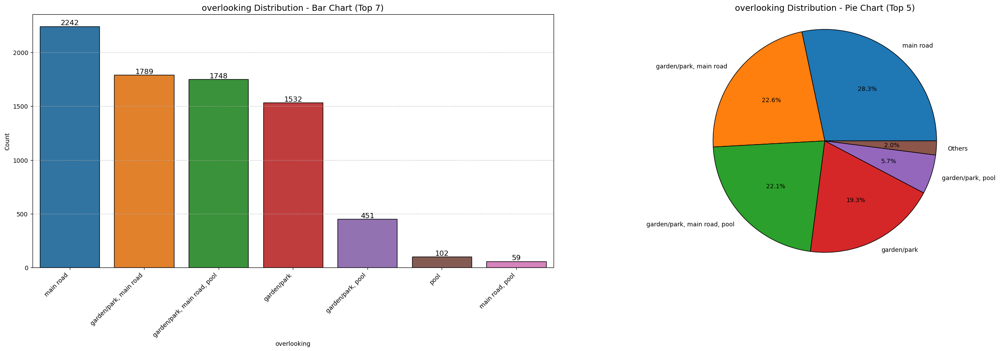

In [114]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'overlooking', bar_top_n=7, pie_top_n=5)

`observation`
- 3962 missing values
- main road and garden/park are the most common "overlooking" categories
- make 5th category as other(pool) which can have this combination garden/park, pool or main road, pool

# ownership

In [115]:
cat_summary(df, 'ownership', top_n=4, threshold=90)

--------------------------------------------------
Quick Glance:


0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: ownership, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 4 categories
Missing Data   : 3,601 rows (30.31 %)
Available Data : 8,278 / 11,879 rows
--------------------------------------------------
summary:


,
count,8278
unique,4
top,freehold
freq,5915


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
freehold,5915,71.45,71.45



1 Categories in 'ownership' with cumulative percentage ≤ 90%:
['freehold']


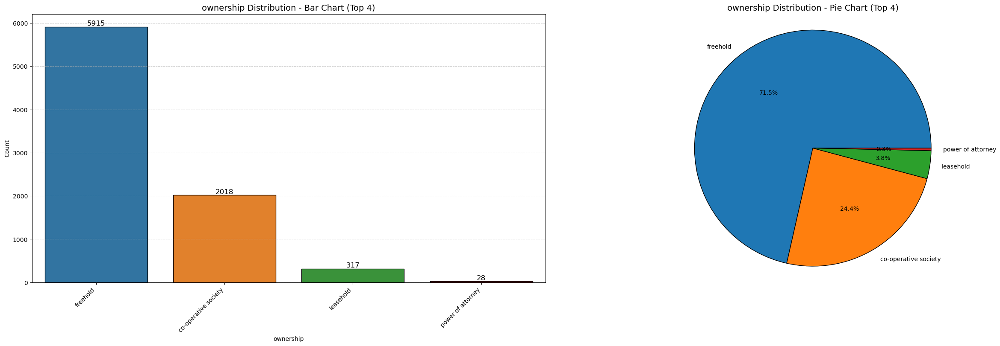

In [116]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'ownership', bar_top_n=4, pie_top_n=4)

`observation`
- freehold - owner has complete ownership of both the building and the land it is built on.
- leasehold - buyer owns the building but not the land it is built on.the land is leased from a landlord (often referred to as the freeholder) for a specific period, typically ranging from 30 to 99 years or more.
- Co-operative society in property ownership refers to a housing arrangement where the property (e.g., an apartment building) is owned and managed by a co-operative society
- Power of Attorney (PoA) in property allows a person (the principal) to authorize another (the agent) to manage, sell, lease, or transfer property on their behalf, without granting ownership.

`observation`
- 3604 missing values
- most of the properties are from freehold properties 71.44% followed by the co-op society

# extra_rooms

In [117]:
cat_summary(df, 'extra_rooms', top_n=16, threshold=90)

--------------------------------------------------
Quick Glance:


0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: extra_rooms, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 16 categories
Missing Data   : 5,289 rows (44.52 %)
Available Data : 6,590 / 11,879 rows
--------------------------------------------------
summary:


,
count,6590
unique,16
top,none of these
freq,3002


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
none of these,3002,45.55,45.55
store,1109,16.83,62.38
puja,741,11.24,73.62
"puja, servant, store, study",316,4.80,78.42
study,309,4.69,83.11
servant,296,4.49,87.60



6 Categories in 'extra_rooms' with cumulative percentage ≤ 90%:
['none of these', 'store', 'puja', 'puja, servant, store, study', 'study', 'servant']


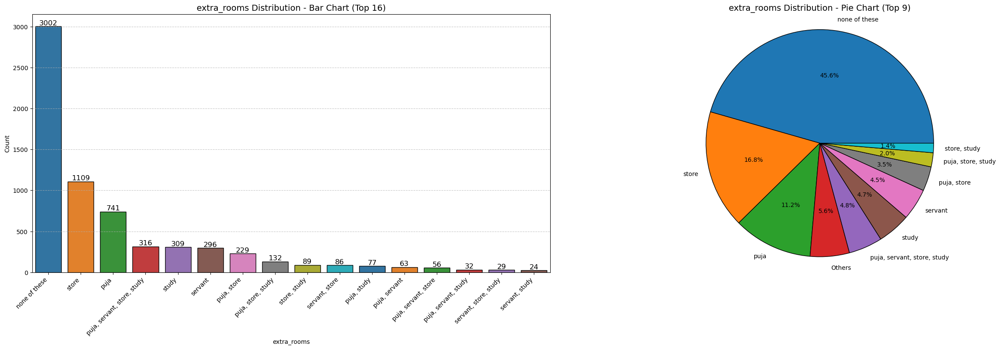

In [118]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'extra_rooms', bar_top_n=16, pie_top_n=9)

`observation`
- 5296 missing values
- 45.54% properties dont have extra rooms
- most properties have store room followed by puja,study,servant
- feature engineering for this column eg: puja,servant so consider this as 2 rooms 

# builder

In [119]:
cat_summary(df, 'builder', top_n=8, threshold=90) 

--------------------------------------------------
Quick Glance:


0                 raymond realty
1                 paradise group
2    n rose developers pvt. ltd.
3                    avant group
4                        mj shah
Name: builder, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 1145 categories
Missing Data   : 4,264 rows (35.90 %)
Available Data : 7,615 / 11,879 rows
--------------------------------------------------
summary:


,
count,7615
unique,1145
top,lodha group
freq,468


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
lodha group,468,6.15,6.15
godrej properties,277,3.64,9.79
rustomjee,241,3.16,12.95
piramal realty,227,2.98,15.93
oberoi realty ltd.,199,2.61,18.54
hiranandani group,171,2.25,20.79
l&t realty,153,2.01,22.80
runwal group,143,1.88,24.68



8 Categories in 'builder' with cumulative percentage ≤ 90%:
['lodha group', 'godrej properties', 'rustomjee', 'piramal realty', 'oberoi realty ltd.', 'hiranandani group', 'l&t realty', 'runwal group']


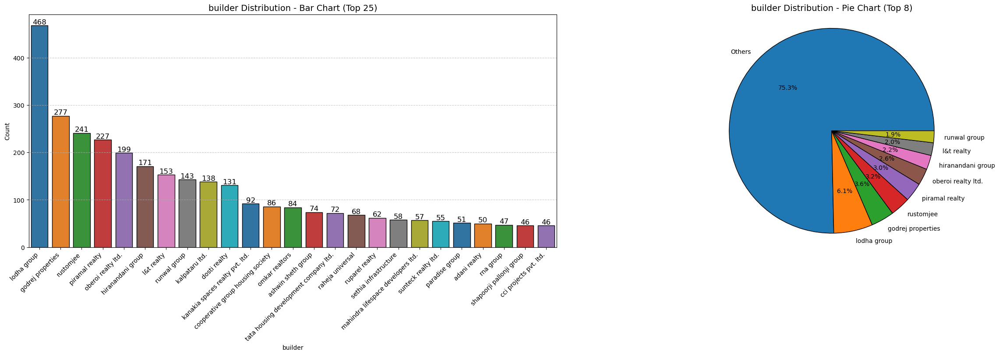

In [120]:
bar_pie_chart_plot(df, 'builder', bar_top_n=25, pie_top_n=8)

In [121]:
project_counts = df['builder'].value_counts()

# Frequency distribution for societies
frequency_bins = {
    "High (50-100)": int(((project_counts >= 50) & (project_counts <= 100)).sum()),
    "Average (10-49)": int(((project_counts >= 10) & (project_counts < 50)).sum()),
    "Low (2-9)": int(((project_counts > 1) & (project_counts < 10)).sum()),
    "Very Low (1)": int((project_counts == 1).sum())
}
frequency_bins

{'High (50-100)': 12,
 'Average (10-49)': 124,
 'Low (2-9)': 499,
 'Very Low (1)': 500}

`observation`
- High cardinality feature 
- total 1146 unique builders   
- The top 49 builders have 50 percent of the projects and the rest 50 percent of the properties come under the remaining 1097 builders
- while doing the train test split ensure that the train-test split maintains the same proportion of high-volume and low-volume projects to prevent bias during training and testing. i.e do statified sampling
  - High (50-100): 12 builders have done 50 to 100 projects 
  - Average (10-49): 124 builders have done 10 to 149 projects 
  - Low (2-9): 499 builders have done 2 to 9 projects 
  - Very Low (1): 501 builders have done only 1 project
- Total 4273 missing values 

# project_name

In [122]:
cat_summary(df, 'project_name', top_n=5, threshold=90)

--------------------------------------------------
Quick Glance:


0    tenx habitat raymond realty
1      paradise sai world empire
2                 northern hills
3               avant heritage v
4                      centrionx
Name: project_name, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 2940 categories
Missing Data   : 3,488 rows (29.36 %)
Available Data : 8,391 / 11,879 rows
--------------------------------------------------
summary:


,
count,8391
unique,2940
top,oberoi sky city
freq,96


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
oberoi sky city,96,1.14,1.14
piramal vaikunth,90,1.07,2.21
tata serein,71,0.85,3.06
omkar alta monte,67,0.80,3.86
rustomjee crown,66,0.79,4.65



5 Categories in 'project_name' with cumulative percentage ≤ 90%:
['oberoi sky city', 'piramal vaikunth', 'tata serein', 'omkar alta monte', 'rustomjee crown']


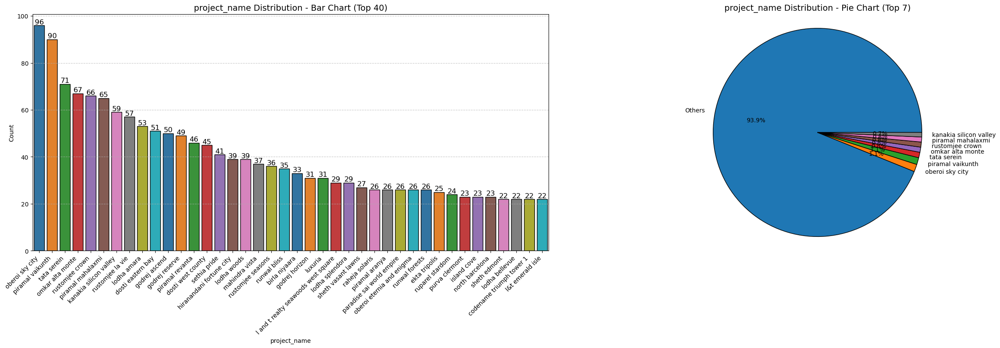

In [123]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'project_name', bar_top_n=40, pie_top_n=7)

creating categories for project_name 

In [124]:
society_counts = df['project_name'].value_counts()

# Frequency distribution for societies
frequency_bins = {
    "High (50-100)": int(((society_counts >= 50) & (society_counts <= 100)).sum()),
    "Average (10-49)": int(((society_counts >= 10) & (society_counts < 50)).sum()),
    "Low (2-9)": int(((society_counts > 1) & (society_counts < 10)).sum()),
    "Very Low (1)": int((society_counts == 1).sum())
}
frequency_bins

{'High (50-100)': 11,
 'Average (10-49)': 142,
 'Low (2-9)': 1008,
 'Very Low (1)': 1779}

`Observation`
- High cardinality feature 
- total 2943 unique project_name   
- The top 317 project_names have 50 percent of the preperties and the rest 50 percent of the properties come under the remaining 2626 project_names
- while doing the train test split ensure that the train-test split maintains the same proportion of high-volume and low-volume projects to prevent bias during training and testing. i.e do statified sampling
  - High (50-100): 11 societies have between 50 to 100 listings.
  - Average (10-49): 142 societies fall in this range with 10 to 49 listings each.
  - Low (2-9): 1011 societies have between 2 to 9 listings.
  - Very Low (1): A significant number, 1779 societies, have only 1 listing.
- Total 3495 missing values 

# furnish

In [125]:
cat_summary(df, 'furnish', top_n=3, threshold=90)

--------------------------------------------------
Quick Glance:


0    unfurnished
1    unfurnished
2    unfurnished
3    unfurnished
4    unfurnished
Name: furnish, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 3 categories
Missing Data   : 39 rows (0.33 %)
Available Data : 11,840 / 11,879 rows
--------------------------------------------------
summary:


,
count,11840
unique,3
top,unfurnished
freq,7472


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
unfurnished,7472,63.11,63.11



1 Categories in 'furnish' with cumulative percentage ≤ 90%:
['unfurnished']


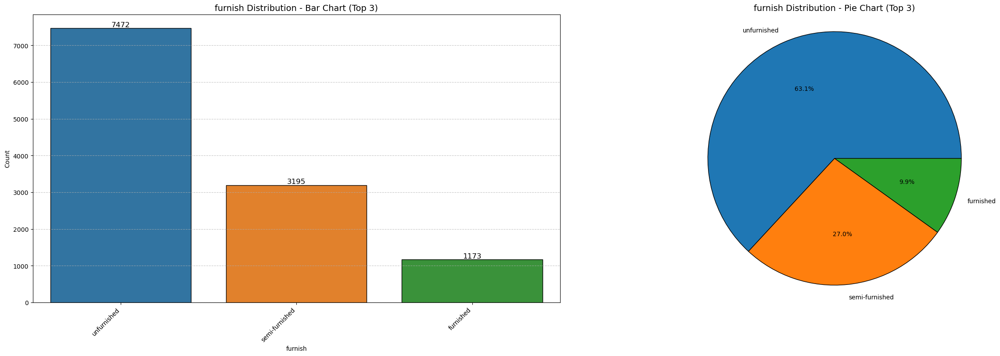

In [126]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'furnish', bar_top_n=3, pie_top_n=3)

`observation`
- 39 missing values
- unfurnished(63.10%) properties are more followed by semi-furnished(26.99%) and furnished(9.91%)

# property_type

In [127]:
cat_summary(df, 'property_type', top_n=2, threshold=90)

--------------------------------------------------
Quick Glance:


0    new property
1    new property
2    new property
3    new property
4    new property
Name: property_type, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 2 categories
Missing Data   : 3 rows (0.03 %)
Available Data : 11,876 / 11,879 rows
--------------------------------------------------
summary:


,
count,11876
unique,2
top,resale
freq,6714


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
resale,6714,56.53,56.53



1 Categories in 'property_type' with cumulative percentage ≤ 90%:
['resale']


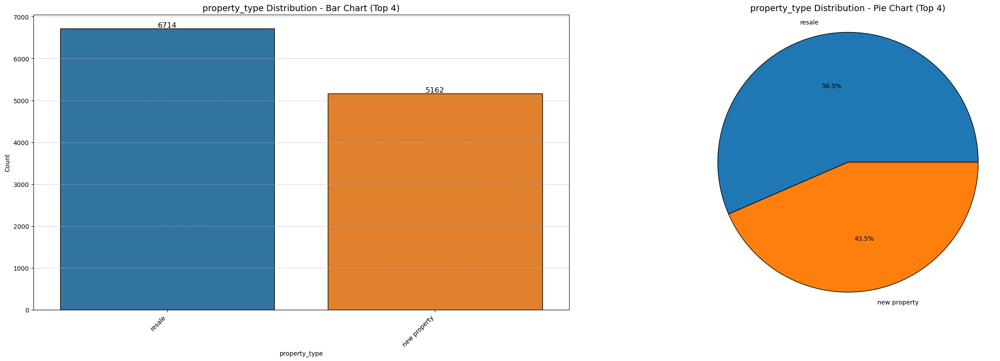

In [128]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'property_type', bar_top_n=4, pie_top_n=4)

`observation`
- 3 missing values 
- 56.50% data is resale
- 43.5% data is new property
- and remaining 0.069% is other,nan and rent properties 

# status

In [129]:
cat_summary(df, 'status', top_n=3, threshold=90)

--------------------------------------------------
Quick Glance:


0    under construction
1    under construction
2    under construction
3    under construction
4    under construction
Name: status, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 3 categories
Missing Data   : 83 rows (0.70 %)
Available Data : 11,796 / 11,879 rows
--------------------------------------------------
summary:


,
count,11796
unique,3
top,ready to move
freq,7239


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
ready to move,7239,61.37,61.37



1 Categories in 'status' with cumulative percentage ≤ 90%:
['ready to move']


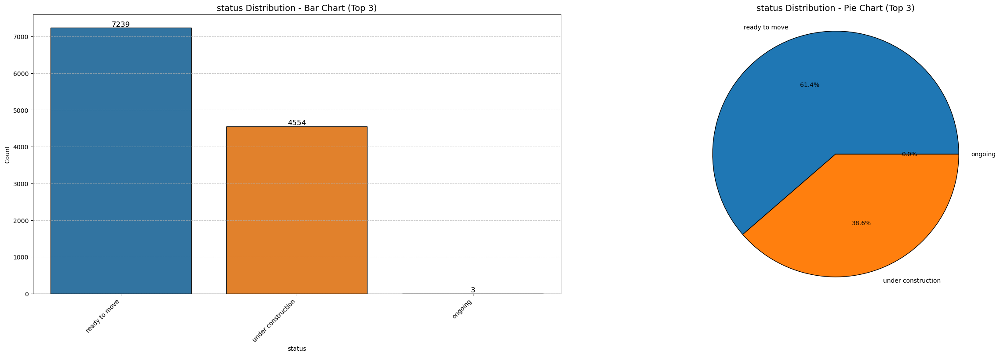

In [130]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'status', bar_top_n=3, pie_top_n=3)

`observation`
- 83 missing values
- 61.4% are ready to move properties
- 38.6% under construction properties
- 0.030 are ongoing,immediatly and nan properties 

# facing

In [131]:
cat_summary(df, 'facing', top_n=8, threshold=90)

--------------------------------------------------
Quick Glance:


0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: facing, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 8 categories
Missing Data   : 3,727 rows (31.37 %)
Available Data : 8,152 / 11,879 rows
--------------------------------------------------
summary:


,
count,8152
unique,8
top,east
freq,4728


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
east,4728,58.00,58.00
north - east,1263,15.49,73.49
west,916,11.24,84.73



3 Categories in 'facing' with cumulative percentage ≤ 90%:
['east', 'north - east', 'west']


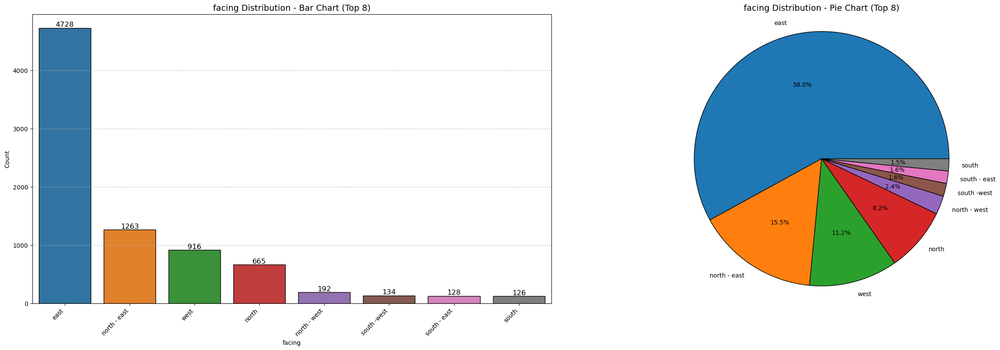

In [132]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'facing', bar_top_n=8, pie_top_n=8)

`observation`
- 3730 missing values
- 58.00% properties have east facing followed by north-east(15.5%) and west(11.2%)
- all other facing are less than 10%

# seller

In [133]:
cat_summary(df, 'seller', top_n=10, threshold=100)

--------------------------------------------------
Quick Glance:


0       organization
1    realestateagent
2       organization
3       organization
4       organization
Name: seller, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 3 categories
Missing Data   : 0 rows (0.00 %)
Available Data : 11,879 / 11,879 rows
--------------------------------------------------
summary:


,
count,11879
unique,3
top,realestateagent
freq,8106


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
realestateagent,8106,68.24,68.24
person,3413,28.73,96.97
organization,360,3.03,100.00



3 Categories in 'seller' with cumulative percentage ≤ 100%:
['realestateagent', 'person', 'organization']


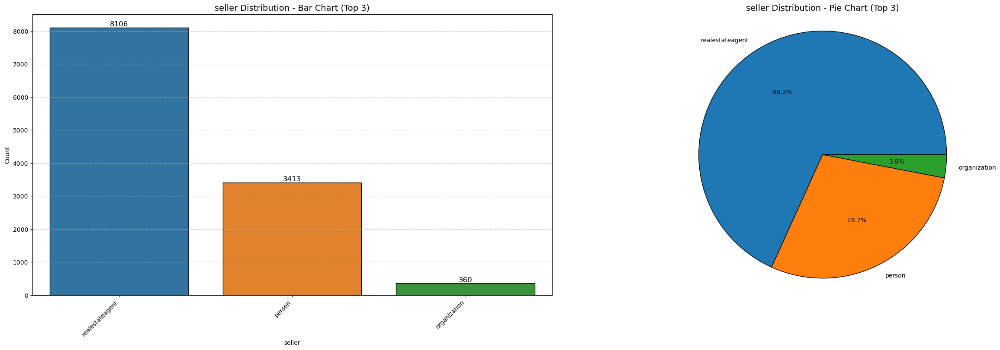

In [134]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'seller', bar_top_n=3, pie_top_n=3)

`observations`
- The column represents the entity responsible for selling the property.  
- There are no missing values in this column.  
- 68.20% of properties are listed by estate agents acting as brokers to facilitate sales.  
- 28.80% of properties are being sold directly by individuals (could be owners or estate agents as well).  
- 3.00% of properties are listed for sale by organizations.  

# addressregion

In [135]:
cat_summary(df, 'addressregion', top_n=4, threshold=90)

--------------------------------------------------
Quick Glance:


0          thane
1    navi mumbai
2         mumbai
3         mumbai
4         mumbai
Name: addressregion, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 4 categories
Missing Data   : 0 rows (0.00 %)
Available Data : 11,879 / 11,879 rows
--------------------------------------------------
summary:


,
count,11879
unique,4
top,mumbai
freq,7738


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
mumbai,7738,65.14,65.14
thane,2026,17.06,82.20



2 Categories in 'addressregion' with cumulative percentage ≤ 90%:
['mumbai', 'thane']


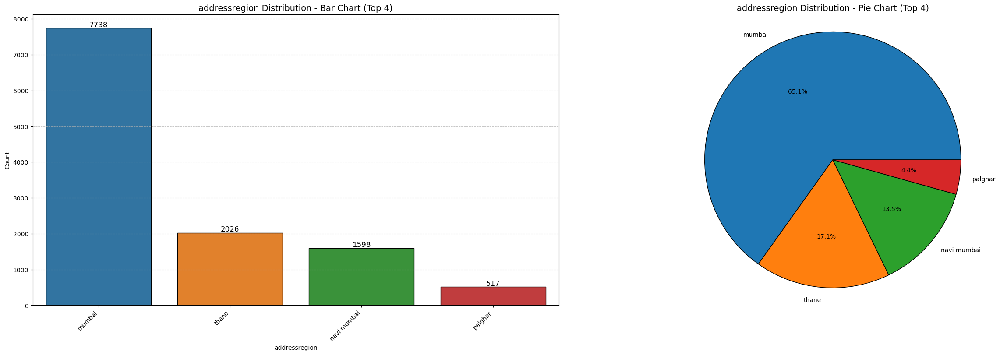

In [136]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'addressregion', bar_top_n=4, pie_top_n=4)

`observation`
- most of the data is from mumbai region and it can create bias
- thane and navi mumbai almost have same properties in data
- very less number of properties for palghar region 

# price_category

In [137]:
cat_summary(df, 'price_category', top_n=13, threshold=90)

--------------------------------------------------
Quick Glance:


0    unfurnished
1    unfurnished
2    unfurnished
3    unfurnished
4    unfurnished
Name: furnish, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 3 categories
Missing Data   : 39 rows (0.33 %)
Available Data : 11,840 / 11,879 rows
--------------------------------------------------
summary:


,
count,11840
unique,3
top,unfurnished
freq,7472


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
unfurnished,7472,63.11,63.11



1 Categories in 'furnish' with cumulative percentage ≤ 90%:
['unfurnished']


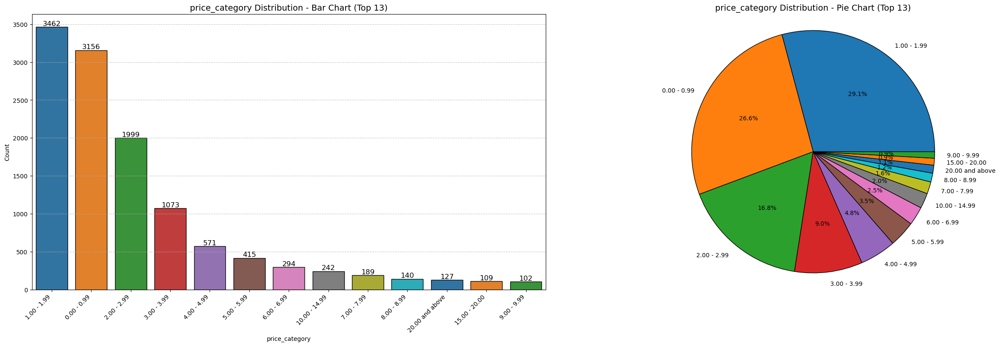

In [138]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'price_category', bar_top_n=13, pie_top_n=13)

`observation`
- 80% properties are below 4 cr

# location_from_wholeaddress

In [139]:
cat_summary(df, 'location_from_wholeaddress', top_n=13, threshold=90)

--------------------------------------------------
Quick Glance:


0       pokhran road
1           kharghar
2       dahisar east
3    jogeshwari east
4            govandi
Name: location_from_wholeaddress, dtype: object

--------------------------------------------------
Meta-data
Data Type      : object
Cardinality    : 904 categories
Missing Data   : 484 rows (4.07 %)
Available Data : 11,395 / 11,879 rows
--------------------------------------------------
summary:


,
count,11395
unique,904
top,mulund west
freq,336


--------------------------------------------------
Categories Distribution:


,count,percentage,cum_percent
category,,,
mulund west,336,2.95,2.95
andheri west,297,2.61,5.56
kandivali east,284,2.49,8.05
kharghar,263,2.31,10.36
powai,242,2.12,12.48
andheri east,242,2.12,14.60
malad west,241,2.11,16.71
chembur,235,2.06,18.77
panvel,228,2.00,20.77



13 Categories in 'location_from_wholeaddress' with cumulative percentage ≤ 90%:
['mulund west', 'andheri west', 'kandivali east', 'kharghar', 'powai', 'andheri east', 'malad west', 'chembur', 'panvel', 'goregaon west', 'kandivali west', 'borivali east', 'mira road east']


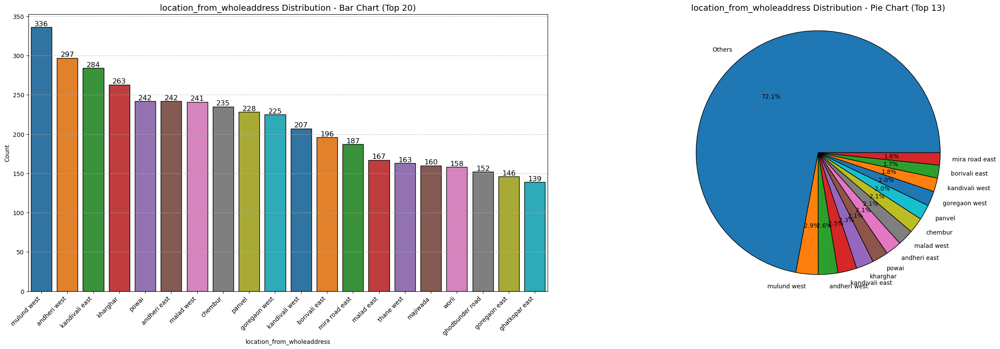

In [140]:
#bar chart and pie plot 
bar_pie_chart_plot(df, 'location_from_wholeaddress', bar_top_n=20, pie_top_n=13)

In [141]:
df.to_csv("2nd_after_univariate_analysis_dataset.csv",index=False)

In [142]:
df.to_excel('2nd_after_univariate_dataset.xlsx',index=False)

In [143]:
len(df.columns)

179

In [144]:
df.columns


Index(['id', 'url', 'image', 'name', 'wholeaddress', 'address', 'flooring',
       'image_urls', 'available_units', 'towers',
       ...
       'seller', 'price_category', 'education', 'transport', 'shopping_centre',
       'commercial_hub', 'hospital', 'tourist', 'emi', 'project_in_acres'],
      dtype='object', length=179)